# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)

adata.X = adata.layers["counts"].copy()
del adata.layers
adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
gc.collect()

12

In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|dose_training",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|condition",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['condition', 'dose_training']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "cpa_sciplex_v1_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: 7yiag2cd
Name: elegant-fighter-89
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/7yiag2cd
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240504_153251-7yiag2cd/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `training` set. Number of elements in each group: 1770,1550,1433,1699,1433,1521,1447,996
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1498,3564,2229,2788,1770
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `dose_training` for `validation` set. Number of elements in each group: 385,411,359,472,357,419,320,239
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 441,904,531,701,385
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:13<2:12:50, 13.31s/it]

Epoch 1/600:   0%|          | 1/600 [00:13<2:12:50, 13.31s/it, v_num=cd_1, total_loss_train=2.7e+3, kl_local_train=40.5]

Epoch 2/600:   0%|          | 1/600 [00:13<2:12:50, 13.31s/it, v_num=cd_1, total_loss_train=2.7e+3, kl_local_train=40.5]

Epoch 2/600:   0%|          | 2/600 [00:22<1:49:22, 10.97s/it, v_num=cd_1, total_loss_train=2.7e+3, kl_local_train=40.5]

Epoch 2/600:   0%|          | 2/600 [00:22<1:49:22, 10.97s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=70] 

Epoch 3/600:   0%|          | 2/600 [00:22<1:49:22, 10.97s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=70]

Epoch 3/600:   0%|          | 3/600 [00:32<1:43:31, 10.40s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=70]

Epoch 3/600:   0%|          | 3/600 [00:32<1:43:31, 10.40s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=76.1]

Epoch 4/600:   0%|          | 3/600 [00:32<1:43:31, 10.40s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=76.1]

Epoch 4/600:   1%|          | 4/600 [00:42<1:40:51, 10.15s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=76.1]

Epoch 4/600:   1%|          | 4/600 [00:42<1:40:51, 10.15s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=76.3] 

Epoch 5/600:   1%|          | 4/600 [00:42<1:40:51, 10.15s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=76.3]

Epoch 5/600:   1%|          | 5/600 [00:52<1:40:57, 10.18s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=76.3]

Epoch 5/600:   1%|          | 5/600 [00:52<1:40:57, 10.18s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=73.2]

Epoch 6/600:   1%|          | 5/600 [00:52<1:40:57, 10.18s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=73.2]

Epoch 6/600:   1%|          | 6/600 [01:02<1:39:33, 10.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=73.2]

Epoch 6/600:   1%|          | 6/600 [01:02<1:39:33, 10.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 7/600:   1%|          | 6/600 [01:02<1:39:33, 10.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 7/600:   1%|          | 7/600 [01:10<1:35:18,  9.64s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=65.2, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 7/600:   1%|          | 7/600 [01:10<1:35:18,  9.64s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=51.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 8/600:   1%|          | 7/600 [01:10<1:35:18,  9.64s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=51.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 8/600:   1%|▏         | 8/600 [01:20<1:34:05,  9.54s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=51.4, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 8/600:   1%|▏         | 8/600 [01:20<1:34:05,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 9/600:   1%|▏         | 8/600 [01:20<1:34:05,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 9/600:   2%|▏         | 9/600 [01:29<1:32:51,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=60.3, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 9/600:   2%|▏         | 9/600 [01:29<1:32:51,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=58.6, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 10/600:   2%|▏         | 9/600 [01:29<1:32:51,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=58.6, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 10/600:   2%|▏         | 10/600 [01:39<1:33:20,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=58.6, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 10/600:   2%|▏         | 10/600 [01:39<1:33:20,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=56.2, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 11/600:   2%|▏         | 10/600 [01:39<1:33:20,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=56.2, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 11/600:   2%|▏         | 11/600 [01:48<1:33:40,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=56.2, metric_mi|dose_training_train=0.0379, metric_mi|condition_train=0.0299]

Epoch 11/600:   2%|▏         | 11/600 [01:48<1:33:40,  9.54s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=58.9, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142] 

Epoch 12/600:   2%|▏         | 11/600 [01:48<1:33:40,  9.54s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=58.9, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 12/600:   2%|▏         | 12/600 [01:57<1:30:32,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=58.9, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 12/600:   2%|▏         | 12/600 [01:57<1:30:32,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 13/600:   2%|▏         | 12/600 [01:57<1:30:32,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 13/600:   2%|▏         | 13/600 [02:06<1:29:58,  9.20s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=62.1, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 13/600:   2%|▏         | 13/600 [02:06<1:29:58,  9.20s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 14/600:   2%|▏         | 13/600 [02:06<1:29:58,  9.20s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 14/600:   2%|▏         | 14/600 [02:15<1:29:48,  9.20s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=61.2, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 14/600:   2%|▏         | 14/600 [02:15<1:29:48,  9.20s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=69, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]  

Epoch 15/600:   2%|▏         | 14/600 [02:15<1:29:48,  9.20s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=69, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 15/600:   2%|▎         | 15/600 [02:25<1:30:38,  9.30s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=69, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 15/600:   2%|▎         | 15/600 [02:25<1:30:38,  9.30s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 16/600:   2%|▎         | 15/600 [02:25<1:30:38,  9.30s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 16/600:   3%|▎         | 16/600 [02:34<1:31:57,  9.45s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=76.5, metric_mi|dose_training_train=0.0553, metric_mi|condition_train=0.142]

Epoch 16/600:   3%|▎         | 16/600 [02:34<1:31:57,  9.45s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 17/600:   3%|▎         | 16/600 [02:34<1:31:57,  9.45s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 17/600:   3%|▎         | 17/600 [02:43<1:29:45,  9.24s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 17/600:   3%|▎         | 17/600 [02:43<1:29:45,  9.24s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135] 

Epoch 18/600:   3%|▎         | 17/600 [02:43<1:29:45,  9.24s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 18/600:   3%|▎         | 18/600 [02:52<1:28:37,  9.14s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 18/600:   3%|▎         | 18/600 [02:52<1:28:37,  9.14s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 19/600:   3%|▎         | 18/600 [02:52<1:28:37,  9.14s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 19/600:   3%|▎         | 19/600 [03:01<1:28:32,  9.14s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 19/600:   3%|▎         | 19/600 [03:01<1:28:32,  9.14s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135] 

Epoch 20/600:   3%|▎         | 19/600 [03:01<1:28:32,  9.14s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 20/600:   3%|▎         | 20/600 [03:11<1:29:52,  9.30s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=103, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 20/600:   3%|▎         | 20/600 [03:11<1:29:52,  9.30s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 21/600:   3%|▎         | 20/600 [03:12<1:29:52,  9.30s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 21/600:   4%|▎         | 21/600 [03:21<1:31:10,  9.45s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=112, metric_mi|dose_training_train=0.0684, metric_mi|condition_train=0.135]

Epoch 21/600:   4%|▎         | 21/600 [03:21<1:31:10,  9.45s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 22/600:   4%|▎         | 21/600 [03:21<1:31:10,  9.45s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 22/600:   4%|▎         | 22/600 [03:29<1:28:46,  9.21s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=114, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 22/600:   4%|▎         | 22/600 [03:29<1:28:46,  9.21s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 23/600:   4%|▎         | 22/600 [03:29<1:28:46,  9.21s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 23/600:   4%|▍         | 23/600 [03:39<1:28:26,  9.20s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 23/600:   4%|▍         | 23/600 [03:39<1:28:26,  9.20s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 24/600:   4%|▍         | 23/600 [03:39<1:28:26,  9.20s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 24/600:   4%|▍         | 24/600 [03:48<1:28:14,  9.19s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=117, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 24/600:   4%|▍         | 24/600 [03:48<1:28:14,  9.19s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 25/600:   4%|▍         | 24/600 [03:48<1:28:14,  9.19s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 25/600:   4%|▍         | 25/600 [03:57<1:28:20,  9.22s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=118, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 25/600:   4%|▍         | 25/600 [03:57<1:28:20,  9.22s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 26/600:   4%|▍         | 25/600 [03:58<1:28:20,  9.22s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 26/600:   4%|▍         | 26/600 [04:06<1:28:36,  9.26s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=128, metric_mi|dose_training_train=0.0798, metric_mi|condition_train=0.133]

Epoch 26/600:   4%|▍         | 26/600 [04:06<1:28:36,  9.26s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=139, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 27/600:   4%|▍         | 26/600 [04:06<1:28:36,  9.26s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=139, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 27/600:   4%|▍         | 27/600 [04:15<1:28:06,  9.23s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=139, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 27/600:   4%|▍         | 27/600 [04:15<1:28:06,  9.23s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=145, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 28/600:   4%|▍         | 27/600 [04:16<1:28:06,  9.23s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=145, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 28/600:   5%|▍         | 28/600 [04:25<1:27:54,  9.22s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=145, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 28/600:   5%|▍         | 28/600 [04:25<1:27:54,  9.22s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=158, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 29/600:   5%|▍         | 28/600 [04:25<1:27:54,  9.22s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=158, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 29/600:   5%|▍         | 29/600 [04:34<1:27:07,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=158, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 29/600:   5%|▍         | 29/600 [04:34<1:27:07,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=165, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 30/600:   5%|▍         | 29/600 [04:34<1:27:07,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=165, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 30/600:   5%|▌         | 30/600 [04:43<1:26:54,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=165, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 30/600:   5%|▌         | 30/600 [04:43<1:26:54,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=166, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 31/600:   5%|▌         | 30/600 [04:43<1:26:54,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=166, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 31/600:   5%|▌         | 31/600 [04:53<1:28:54,  9.38s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=166, metric_mi|dose_training_train=0.0905, metric_mi|condition_train=0.133]

Epoch 31/600:   5%|▌         | 31/600 [04:53<1:28:54,  9.38s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143] 

Epoch 32/600:   5%|▌         | 31/600 [04:53<1:28:54,  9.38s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 32/600:   5%|▌         | 32/600 [05:02<1:29:45,  9.48s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=173, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 32/600:   5%|▌         | 32/600 [05:02<1:29:45,  9.48s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 33/600:   5%|▌         | 32/600 [05:02<1:29:45,  9.48s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 33/600:   6%|▌         | 33/600 [05:12<1:30:30,  9.58s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=185, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 33/600:   6%|▌         | 33/600 [05:12<1:30:30,  9.58s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 34/600:   6%|▌         | 33/600 [05:12<1:30:30,  9.58s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 34/600:   6%|▌         | 34/600 [05:21<1:28:47,  9.41s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=192, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 34/600:   6%|▌         | 34/600 [05:21<1:28:47,  9.41s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 35/600:   6%|▌         | 34/600 [05:21<1:28:47,  9.41s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 35/600:   6%|▌         | 35/600 [05:30<1:27:16,  9.27s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=206, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 35/600:   6%|▌         | 35/600 [05:30<1:27:16,  9.27s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=220, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 36/600:   6%|▌         | 35/600 [05:31<1:27:16,  9.27s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=220, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 36/600:   6%|▌         | 36/600 [05:39<1:27:00,  9.26s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=220, metric_mi|dose_training_train=0.107, metric_mi|condition_train=0.143]

Epoch 36/600:   6%|▌         | 36/600 [05:39<1:27:00,  9.26s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=225, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 37/600:   6%|▌         | 36/600 [05:39<1:27:00,  9.26s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=225, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 37/600:   6%|▌         | 37/600 [05:48<1:26:08,  9.18s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=225, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 37/600:   6%|▌         | 37/600 [05:48<1:26:08,  9.18s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=232, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 38/600:   6%|▌         | 37/600 [05:48<1:26:08,  9.18s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=232, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 38/600:   6%|▋         | 38/600 [05:58<1:27:11,  9.31s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=232, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 38/600:   6%|▋         | 38/600 [05:58<1:27:11,  9.31s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 39/600:   6%|▋         | 38/600 [05:58<1:27:11,  9.31s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 39/600:   6%|▋         | 39/600 [06:07<1:26:52,  9.29s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=230, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 39/600:   6%|▋         | 39/600 [06:07<1:26:52,  9.29s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=231, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 40/600:   6%|▋         | 39/600 [06:07<1:26:52,  9.29s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=231, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 40/600:   7%|▋         | 40/600 [06:16<1:25:43,  9.18s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=231, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 40/600:   7%|▋         | 40/600 [06:16<1:25:43,  9.18s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 41/600:   7%|▋         | 40/600 [06:17<1:25:43,  9.18s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 41/600:   7%|▋         | 41/600 [06:26<1:26:57,  9.33s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=241, metric_mi|dose_training_train=0.128, metric_mi|condition_train=0.154]

Epoch 41/600:   7%|▋         | 41/600 [06:26<1:26:57,  9.33s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=245, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 42/600:   7%|▋         | 41/600 [06:26<1:26:57,  9.33s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=245, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 42/600:   7%|▋         | 42/600 [06:35<1:26:01,  9.25s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=245, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 42/600:   7%|▋         | 42/600 [06:35<1:26:01,  9.25s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=256, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 43/600:   7%|▋         | 42/600 [06:35<1:26:01,  9.25s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=256, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 43/600:   7%|▋         | 43/600 [06:44<1:25:31,  9.21s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=256, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 43/600:   7%|▋         | 43/600 [06:44<1:25:31,  9.21s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=261, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 44/600:   7%|▋         | 43/600 [06:44<1:25:31,  9.21s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=261, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 44/600:   7%|▋         | 44/600 [06:53<1:24:01,  9.07s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=261, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 44/600:   7%|▋         | 44/600 [06:53<1:24:01,  9.07s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=264, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 45/600:   7%|▋         | 44/600 [06:53<1:24:01,  9.07s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=264, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 45/600:   8%|▊         | 45/600 [07:02<1:24:29,  9.13s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=264, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 45/600:   8%|▊         | 45/600 [07:02<1:24:29,  9.13s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=273, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 46/600:   8%|▊         | 45/600 [07:03<1:24:29,  9.13s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=273, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 46/600:   8%|▊         | 46/600 [07:12<1:25:29,  9.26s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=273, metric_mi|dose_training_train=0.148, metric_mi|condition_train=0.166]

Epoch 46/600:   8%|▊         | 46/600 [07:12<1:25:29,  9.26s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=265, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 47/600:   8%|▊         | 46/600 [07:12<1:25:29,  9.26s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=265, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 47/600:   8%|▊         | 47/600 [07:21<1:24:47,  9.20s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=265, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 47/600:   8%|▊         | 47/600 [07:21<1:24:47,  9.20s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=274, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 48/600:   8%|▊         | 47/600 [07:21<1:24:47,  9.20s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=274, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 48/600:   8%|▊         | 48/600 [07:30<1:24:13,  9.15s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=274, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 48/600:   8%|▊         | 48/600 [07:30<1:24:13,  9.15s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=276, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 49/600:   8%|▊         | 48/600 [07:30<1:24:13,  9.15s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=276, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 49/600:   8%|▊         | 49/600 [07:39<1:22:50,  9.02s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=276, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 49/600:   8%|▊         | 49/600 [07:39<1:22:50,  9.02s/it, v_num=cd_1, total_loss_train=2.27e+3, kl_local_train=295, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 50/600:   8%|▊         | 49/600 [07:39<1:22:50,  9.02s/it, v_num=cd_1, total_loss_train=2.27e+3, kl_local_train=295, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 50/600:   8%|▊         | 50/600 [07:48<1:23:19,  9.09s/it, v_num=cd_1, total_loss_train=2.27e+3, kl_local_train=295, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 50/600:   8%|▊         | 50/600 [07:48<1:23:19,  9.09s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=294, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 51/600:   8%|▊         | 50/600 [07:48<1:23:19,  9.09s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=294, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 51/600:   8%|▊         | 51/600 [07:57<1:24:32,  9.24s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=294, metric_mi|dose_training_train=0.163, metric_mi|condition_train=0.175]

Epoch 51/600:   8%|▊         | 51/600 [07:57<1:24:32,  9.24s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=300, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 52/600:   8%|▊         | 51/600 [07:57<1:24:32,  9.24s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=300, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 52/600:   9%|▊         | 52/600 [08:06<1:23:01,  9.09s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=300, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 52/600:   9%|▊         | 52/600 [08:06<1:23:01,  9.09s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=308, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 53/600:   9%|▊         | 52/600 [08:06<1:23:01,  9.09s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=308, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 53/600:   9%|▉         | 53/600 [08:15<1:21:48,  8.97s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=308, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 53/600:   9%|▉         | 53/600 [08:15<1:21:48,  8.97s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=307, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 54/600:   9%|▉         | 53/600 [08:15<1:21:48,  8.97s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=307, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 54/600:   9%|▉         | 54/600 [08:24<1:21:29,  8.96s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=307, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 54/600:   9%|▉         | 54/600 [08:24<1:21:29,  8.96s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=316, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 55/600:   9%|▉         | 54/600 [08:24<1:21:29,  8.96s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=316, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 55/600:   9%|▉         | 55/600 [08:33<1:22:29,  9.08s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=316, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 55/600:   9%|▉         | 55/600 [08:33<1:22:29,  9.08s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=304, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 56/600:   9%|▉         | 55/600 [08:34<1:22:29,  9.08s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=304, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 56/600:   9%|▉         | 56/600 [08:45<1:30:14,  9.95s/it, v_num=cd_1, total_loss_train=2.26e+3, kl_local_train=304, metric_mi|dose_training_train=0.169, metric_mi|condition_train=0.187]

Epoch 56/600:   9%|▉         | 56/600 [08:45<1:30:14,  9.95s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=289, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201] 

Epoch 57/600:   9%|▉         | 56/600 [08:45<1:30:14,  9.95s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=289, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 57/600:  10%|▉         | 57/600 [08:54<1:26:38,  9.57s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=289, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 57/600:  10%|▉         | 57/600 [08:54<1:26:38,  9.57s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=292, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 58/600:  10%|▉         | 57/600 [08:54<1:26:38,  9.57s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=292, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 58/600:  10%|▉         | 58/600 [09:03<1:24:59,  9.41s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=292, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 58/600:  10%|▉         | 58/600 [09:03<1:24:59,  9.41s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=290, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 59/600:  10%|▉         | 58/600 [09:03<1:24:59,  9.41s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=290, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 59/600:  10%|▉         | 59/600 [09:12<1:23:39,  9.28s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=290, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 59/600:  10%|▉         | 59/600 [09:12<1:23:39,  9.28s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=295, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 60/600:  10%|▉         | 59/600 [09:12<1:23:39,  9.28s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=295, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 60/600:  10%|█         | 60/600 [09:21<1:22:38,  9.18s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=295, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 60/600:  10%|█         | 60/600 [09:21<1:22:38,  9.18s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=280, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 61/600:  10%|█         | 60/600 [09:22<1:22:38,  9.18s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=280, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 61/600:  10%|█         | 61/600 [09:30<1:22:44,  9.21s/it, v_num=cd_1, total_loss_train=2.25e+3, kl_local_train=280, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.201]

Epoch 61/600:  10%|█         | 61/600 [09:30<1:22:44,  9.21s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=279, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 62/600:  10%|█         | 61/600 [09:30<1:22:44,  9.21s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=279, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 62/600:  10%|█         | 62/600 [09:39<1:21:50,  9.13s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=279, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 62/600:  10%|█         | 62/600 [09:39<1:21:50,  9.13s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=276, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 63/600:  10%|█         | 62/600 [09:39<1:21:50,  9.13s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=276, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 63/600:  10%|█         | 63/600 [09:48<1:21:30,  9.11s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=276, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 63/600:  10%|█         | 63/600 [09:48<1:21:30,  9.11s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=277, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 64/600:  10%|█         | 63/600 [09:48<1:21:30,  9.11s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=277, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 64/600:  11%|█         | 64/600 [09:57<1:20:46,  9.04s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=277, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 64/600:  11%|█         | 64/600 [09:57<1:20:46,  9.04s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=284, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 65/600:  11%|█         | 64/600 [09:57<1:20:46,  9.04s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=284, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 65/600:  11%|█         | 65/600 [10:06<1:19:53,  8.96s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=284, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 65/600:  11%|█         | 65/600 [10:06<1:19:53,  8.96s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=279, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 66/600:  11%|█         | 65/600 [10:06<1:19:53,  8.96s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=279, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 66/600:  11%|█         | 66/600 [10:15<1:21:53,  9.20s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=279, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.213]

Epoch 66/600:  11%|█         | 66/600 [10:15<1:21:53,  9.20s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=287, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 67/600:  11%|█         | 66/600 [10:15<1:21:53,  9.20s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=287, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 67/600:  11%|█         | 67/600 [10:25<1:23:31,  9.40s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=287, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 67/600:  11%|█         | 67/600 [10:25<1:23:31,  9.40s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=270, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 68/600:  11%|█         | 67/600 [10:25<1:23:31,  9.40s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=270, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 68/600:  11%|█▏        | 68/600 [10:34<1:22:48,  9.34s/it, v_num=cd_1, total_loss_train=2.24e+3, kl_local_train=270, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 68/600:  11%|█▏        | 68/600 [10:34<1:22:48,  9.34s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=262, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 69/600:  11%|█▏        | 68/600 [10:34<1:22:48,  9.34s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=262, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 69/600:  12%|█▏        | 69/600 [10:43<1:21:16,  9.18s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=262, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 69/600:  12%|█▏        | 69/600 [10:43<1:21:16,  9.18s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=258, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 70/600:  12%|█▏        | 69/600 [10:43<1:21:16,  9.18s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=258, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 70/600:  12%|█▏        | 70/600 [10:52<1:20:52,  9.16s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=258, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 70/600:  12%|█▏        | 70/600 [10:52<1:20:52,  9.16s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=252, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 71/600:  12%|█▏        | 70/600 [10:53<1:20:52,  9.16s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=252, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 71/600:  12%|█▏        | 71/600 [11:02<1:21:44,  9.27s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=252, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.221]

Epoch 71/600:  12%|█▏        | 71/600 [11:02<1:21:44,  9.27s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=246, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 72/600:  12%|█▏        | 71/600 [11:02<1:21:44,  9.27s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=246, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 72/600:  12%|█▏        | 72/600 [11:11<1:21:18,  9.24s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=246, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 72/600:  12%|█▏        | 72/600 [11:11<1:21:18,  9.24s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=254, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 73/600:  12%|█▏        | 72/600 [11:11<1:21:18,  9.24s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=254, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 73/600:  12%|█▏        | 73/600 [11:20<1:19:54,  9.10s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=254, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 73/600:  12%|█▏        | 73/600 [11:20<1:19:54,  9.10s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=255, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 74/600:  12%|█▏        | 73/600 [11:20<1:19:54,  9.10s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=255, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 74/600:  12%|█▏        | 74/600 [11:29<1:19:55,  9.12s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=255, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 74/600:  12%|█▏        | 74/600 [11:29<1:19:55,  9.12s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=251, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 75/600:  12%|█▏        | 74/600 [11:29<1:19:55,  9.12s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=251, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 75/600:  12%|█▎        | 75/600 [11:38<1:19:38,  9.10s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=251, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 75/600:  12%|█▎        | 75/600 [11:38<1:19:38,  9.10s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=250, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 76/600:  12%|█▎        | 75/600 [11:39<1:19:38,  9.10s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=250, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 76/600:  13%|█▎        | 76/600 [11:48<1:20:50,  9.26s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=250, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.225]

Epoch 76/600:  13%|█▎        | 76/600 [11:48<1:20:50,  9.26s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=244, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 77/600:  13%|█▎        | 76/600 [11:48<1:20:50,  9.26s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=244, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 77/600:  13%|█▎        | 77/600 [11:57<1:20:09,  9.20s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=244, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 77/600:  13%|█▎        | 77/600 [11:57<1:20:09,  9.20s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=241, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 78/600:  13%|█▎        | 77/600 [11:57<1:20:09,  9.20s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=241, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 78/600:  13%|█▎        | 78/600 [12:05<1:17:47,  8.94s/it, v_num=cd_1, total_loss_train=2.23e+3, kl_local_train=241, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 78/600:  13%|█▎        | 78/600 [12:05<1:17:47,  8.94s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=243, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 79/600:  13%|█▎        | 78/600 [12:05<1:17:47,  8.94s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=243, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 79/600:  13%|█▎        | 79/600 [12:14<1:17:44,  8.95s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=243, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 79/600:  13%|█▎        | 79/600 [12:14<1:17:44,  8.95s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=238, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 80/600:  13%|█▎        | 79/600 [12:14<1:17:44,  8.95s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=238, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 80/600:  13%|█▎        | 80/600 [12:24<1:18:58,  9.11s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=238, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 80/600:  13%|█▎        | 80/600 [12:24<1:18:58,  9.11s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=238, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 81/600:  13%|█▎        | 80/600 [12:24<1:18:58,  9.11s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=238, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 81/600:  14%|█▎        | 81/600 [12:33<1:20:01,  9.25s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=238, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 81/600:  14%|█▎        | 81/600 [12:33<1:20:01,  9.25s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=237, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 82/600:  14%|█▎        | 81/600 [12:33<1:20:01,  9.25s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=237, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 82/600:  14%|█▎        | 82/600 [12:42<1:19:06,  9.16s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=237, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 82/600:  14%|█▎        | 82/600 [12:42<1:19:06,  9.16s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=239, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 83/600:  14%|█▎        | 82/600 [12:42<1:19:06,  9.16s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=239, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 83/600:  14%|█▍        | 83/600 [12:51<1:17:44,  9.02s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=239, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 83/600:  14%|█▍        | 83/600 [12:51<1:17:44,  9.02s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=242, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 84/600:  14%|█▍        | 83/600 [12:51<1:17:44,  9.02s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=242, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 84/600:  14%|█▍        | 84/600 [13:00<1:16:50,  8.93s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=242, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 84/600:  14%|█▍        | 84/600 [13:00<1:16:50,  8.93s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=229, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 85/600:  14%|█▍        | 84/600 [13:00<1:16:50,  8.93s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=229, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 85/600:  14%|█▍        | 85/600 [13:09<1:17:42,  9.05s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=229, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 85/600:  14%|█▍        | 85/600 [13:09<1:17:42,  9.05s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=223, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 86/600:  14%|█▍        | 85/600 [13:09<1:17:42,  9.05s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=223, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 86/600:  14%|█▍        | 86/600 [13:18<1:18:57,  9.22s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=223, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.231]

Epoch 86/600:  14%|█▍        | 86/600 [13:18<1:18:57,  9.22s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=224, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 87/600:  14%|█▍        | 86/600 [13:18<1:18:57,  9.22s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=224, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 87/600:  14%|█▍        | 87/600 [13:27<1:18:15,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=224, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 87/600:  14%|█▍        | 87/600 [13:27<1:18:15,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=222, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 88/600:  14%|█▍        | 87/600 [13:27<1:18:15,  9.15s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=222, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 88/600:  15%|█▍        | 88/600 [13:36<1:15:59,  8.91s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=222, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 88/600:  15%|█▍        | 88/600 [13:36<1:15:59,  8.91s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=219, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 89/600:  15%|█▍        | 88/600 [13:36<1:15:59,  8.91s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=219, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 89/600:  15%|█▍        | 89/600 [13:45<1:16:13,  8.95s/it, v_num=cd_1, total_loss_train=2.22e+3, kl_local_train=219, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 89/600:  15%|█▍        | 89/600 [13:45<1:16:13,  8.95s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 90/600:  15%|█▍        | 89/600 [13:45<1:16:13,  8.95s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 90/600:  15%|█▌        | 90/600 [13:54<1:17:06,  9.07s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 90/600:  15%|█▌        | 90/600 [13:54<1:17:06,  9.07s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=221, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 91/600:  15%|█▌        | 90/600 [13:55<1:17:06,  9.07s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=221, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 91/600:  15%|█▌        | 91/600 [14:04<1:18:27,  9.25s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=221, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.236]

Epoch 91/600:  15%|█▌        | 91/600 [14:04<1:18:27,  9.25s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 92/600:  15%|█▌        | 91/600 [14:04<1:18:27,  9.25s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 92/600:  15%|█▌        | 92/600 [14:13<1:17:07,  9.11s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 92/600:  15%|█▌        | 92/600 [14:13<1:17:07,  9.11s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 93/600:  15%|█▌        | 92/600 [14:13<1:17:07,  9.11s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 93/600:  16%|█▌        | 93/600 [14:21<1:15:20,  8.92s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 93/600:  16%|█▌        | 93/600 [14:21<1:15:20,  8.92s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 94/600:  16%|█▌        | 93/600 [14:21<1:15:20,  8.92s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 94/600:  16%|█▌        | 94/600 [14:30<1:15:35,  8.96s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 94/600:  16%|█▌        | 94/600 [14:30<1:15:35,  8.96s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 95/600:  16%|█▌        | 94/600 [14:30<1:15:35,  8.96s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 95/600:  16%|█▌        | 95/600 [14:40<1:16:23,  9.08s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 95/600:  16%|█▌        | 95/600 [14:40<1:16:23,  9.08s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 96/600:  16%|█▌        | 95/600 [14:40<1:16:23,  9.08s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 96/600:  16%|█▌        | 96/600 [14:49<1:16:34,  9.12s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=218, metric_mi|dose_training_train=0.197, metric_mi|condition_train=0.234]

Epoch 96/600:  16%|█▌        | 96/600 [14:49<1:16:34,  9.12s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 97/600:  16%|█▌        | 96/600 [14:49<1:16:34,  9.12s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 97/600:  16%|█▌        | 97/600 [14:58<1:15:41,  9.03s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=220, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 97/600:  16%|█▌        | 97/600 [14:58<1:15:41,  9.03s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=214, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 98/600:  16%|█▌        | 97/600 [14:58<1:15:41,  9.03s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=214, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 98/600:  16%|█▋        | 98/600 [15:06<1:14:50,  8.95s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=214, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 98/600:  16%|█▋        | 98/600 [15:06<1:14:50,  8.95s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=209, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 99/600:  16%|█▋        | 98/600 [15:06<1:14:50,  8.95s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=209, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 99/600:  16%|█▋        | 99/600 [15:15<1:14:52,  8.97s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=209, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 99/600:  16%|█▋        | 99/600 [15:15<1:14:52,  8.97s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=207, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 100/600:  16%|█▋        | 99/600 [15:15<1:14:52,  8.97s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=207, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 100/600:  17%|█▋        | 100/600 [15:24<1:15:09,  9.02s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=207, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 100/600:  17%|█▋        | 100/600 [15:24<1:15:09,  9.02s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=207, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 101/600:  17%|█▋        | 100/600 [15:25<1:15:09,  9.02s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=207, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 101/600:  17%|█▋        | 101/600 [15:33<1:14:43,  8.98s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=207, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.234]

Epoch 101/600:  17%|█▋        | 101/600 [15:33<1:14:43,  8.98s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=205, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24] 

Epoch 102/600:  17%|█▋        | 101/600 [15:33<1:14:43,  8.98s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=205, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 102/600:  17%|█▋        | 102/600 [15:42<1:14:20,  8.96s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=205, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 102/600:  17%|█▋        | 102/600 [15:42<1:14:20,  8.96s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=191, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 103/600:  17%|█▋        | 102/600 [15:42<1:14:20,  8.96s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=191, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 103/600:  17%|█▋        | 103/600 [15:51<1:14:24,  8.98s/it, v_num=cd_1, total_loss_train=2.21e+3, kl_local_train=191, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 103/600:  17%|█▋        | 103/600 [15:51<1:14:24,  8.98s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=198, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24] 

Epoch 104/600:  17%|█▋        | 103/600 [15:51<1:14:24,  8.98s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=198, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 104/600:  17%|█▋        | 104/600 [16:00<1:13:52,  8.94s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=198, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 104/600:  17%|█▋        | 104/600 [16:00<1:13:52,  8.94s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=201, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 105/600:  17%|█▋        | 104/600 [16:00<1:13:52,  8.94s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=201, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 105/600:  18%|█▊        | 105/600 [16:09<1:13:57,  8.96s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=201, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 105/600:  18%|█▊        | 105/600 [16:09<1:13:57,  8.96s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=201, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 106/600:  18%|█▊        | 105/600 [16:10<1:13:57,  8.96s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=201, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 106/600:  18%|█▊        | 106/600 [16:18<1:14:28,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=201, metric_mi|dose_training_train=0.195, metric_mi|condition_train=0.24]

Epoch 106/600:  18%|█▊        | 106/600 [16:18<1:14:28,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=204, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 107/600:  18%|█▊        | 106/600 [16:18<1:14:28,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=204, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 107/600:  18%|█▊        | 107/600 [16:27<1:14:14,  9.03s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=204, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 107/600:  18%|█▊        | 107/600 [16:27<1:14:14,  9.03s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 108/600:  18%|█▊        | 107/600 [16:27<1:14:14,  9.03s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 108/600:  18%|█▊        | 108/600 [16:36<1:14:05,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=199, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 108/600:  18%|█▊        | 108/600 [16:36<1:14:05,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 109/600:  18%|█▊        | 108/600 [16:36<1:14:05,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 109/600:  18%|█▊        | 109/600 [16:45<1:13:13,  8.95s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 109/600:  18%|█▊        | 109/600 [16:45<1:13:13,  8.95s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=196, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 110/600:  18%|█▊        | 109/600 [16:45<1:13:13,  8.95s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=196, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 110/600:  18%|█▊        | 110/600 [16:54<1:13:49,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=196, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 110/600:  18%|█▊        | 110/600 [16:54<1:13:49,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 111/600:  18%|█▊        | 110/600 [16:55<1:13:49,  9.04s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 111/600:  18%|█▊        | 111/600 [17:04<1:13:59,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.21, metric_mi|condition_train=0.241]

Epoch 111/600:  18%|█▊        | 111/600 [17:04<1:13:59,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=193, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 112/600:  18%|█▊        | 111/600 [17:04<1:13:59,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=193, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 112/600:  19%|█▊        | 112/600 [17:13<1:13:49,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=193, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 112/600:  19%|█▊        | 112/600 [17:13<1:13:49,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=194, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 113/600:  19%|█▊        | 112/600 [17:13<1:13:49,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=194, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 113/600:  19%|█▉        | 113/600 [17:22<1:13:30,  9.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=194, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 113/600:  19%|█▉        | 113/600 [17:22<1:13:30,  9.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=189, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 114/600:  19%|█▉        | 113/600 [17:22<1:13:30,  9.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=189, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 114/600:  19%|█▉        | 114/600 [17:31<1:13:02,  9.02s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=189, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 114/600:  19%|█▉        | 114/600 [17:31<1:13:02,  9.02s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=188, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 115/600:  19%|█▉        | 114/600 [17:31<1:13:02,  9.02s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=188, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 115/600:  19%|█▉        | 115/600 [17:40<1:13:23,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=188, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 115/600:  19%|█▉        | 115/600 [17:40<1:13:23,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=190, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 116/600:  19%|█▉        | 115/600 [17:40<1:13:23,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=190, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 116/600:  19%|█▉        | 116/600 [17:49<1:13:14,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=190, metric_mi|dose_training_train=0.22, metric_mi|condition_train=0.237]

Epoch 116/600:  19%|█▉        | 116/600 [17:49<1:13:14,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 117/600:  19%|█▉        | 116/600 [17:49<1:13:14,  9.08s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 117/600:  20%|█▉        | 117/600 [17:58<1:12:54,  9.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=197, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 117/600:  20%|█▉        | 117/600 [17:58<1:12:54,  9.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=192, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 118/600:  20%|█▉        | 117/600 [17:58<1:12:54,  9.06s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=192, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 118/600:  20%|█▉        | 118/600 [18:07<1:11:59,  8.96s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=192, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 118/600:  20%|█▉        | 118/600 [18:07<1:11:59,  8.96s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=190, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 119/600:  20%|█▉        | 118/600 [18:07<1:11:59,  8.96s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=190, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 119/600:  20%|█▉        | 119/600 [18:16<1:11:36,  8.93s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=190, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 119/600:  20%|█▉        | 119/600 [18:16<1:11:36,  8.93s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=188, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 120/600:  20%|█▉        | 119/600 [18:16<1:11:36,  8.93s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=188, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 120/600:  20%|██        | 120/600 [18:24<1:11:21,  8.92s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=188, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 120/600:  20%|██        | 120/600 [18:24<1:11:21,  8.92s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=186, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 121/600:  20%|██        | 120/600 [18:25<1:11:21,  8.92s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=186, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 121/600:  20%|██        | 121/600 [18:34<1:12:55,  9.13s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=186, metric_mi|dose_training_train=0.228, metric_mi|condition_train=0.233]

Epoch 121/600:  20%|██        | 121/600 [18:34<1:12:55,  9.13s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=186, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 122/600:  20%|██        | 121/600 [18:34<1:12:55,  9.13s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=186, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 122/600:  20%|██        | 122/600 [18:43<1:13:12,  9.19s/it, v_num=cd_1, total_loss_train=2.2e+3, kl_local_train=186, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 122/600:  20%|██        | 122/600 [18:43<1:13:12,  9.19s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 123/600:  20%|██        | 122/600 [18:43<1:13:12,  9.19s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 123/600:  20%|██        | 123/600 [18:53<1:13:05,  9.19s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=184, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 123/600:  20%|██        | 123/600 [18:53<1:13:05,  9.19s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=182, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 124/600:  20%|██        | 123/600 [18:53<1:13:05,  9.19s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=182, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 124/600:  21%|██        | 124/600 [19:01<1:10:44,  8.92s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=182, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 124/600:  21%|██        | 124/600 [19:01<1:10:44,  8.92s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=179, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 125/600:  21%|██        | 124/600 [19:01<1:10:44,  8.92s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=179, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 125/600:  21%|██        | 125/600 [19:10<1:11:37,  9.05s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=179, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 125/600:  21%|██        | 125/600 [19:10<1:11:37,  9.05s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=178, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 126/600:  21%|██        | 125/600 [19:11<1:11:37,  9.05s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=178, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 126/600:  21%|██        | 126/600 [19:20<1:12:29,  9.18s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=178, metric_mi|dose_training_train=0.232, metric_mi|condition_train=0.234]

Epoch 126/600:  21%|██        | 126/600 [19:20<1:12:29,  9.18s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=180, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23] 

Epoch 127/600:  21%|██        | 126/600 [19:20<1:12:29,  9.18s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=180, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 127/600:  21%|██        | 127/600 [19:29<1:12:16,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=180, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 127/600:  21%|██        | 127/600 [19:29<1:12:16,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=172, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 128/600:  21%|██        | 127/600 [19:29<1:12:16,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=172, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 128/600:  21%|██▏       | 128/600 [19:37<1:10:31,  8.97s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=172, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 128/600:  21%|██▏       | 128/600 [19:37<1:10:31,  8.97s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=172, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 129/600:  21%|██▏       | 128/600 [19:37<1:10:31,  8.97s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=172, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 129/600:  22%|██▏       | 129/600 [19:46<1:09:34,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=172, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 129/600:  22%|██▏       | 129/600 [19:46<1:09:34,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 130/600:  22%|██▏       | 129/600 [19:46<1:09:34,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 130/600:  22%|██▏       | 130/600 [19:55<1:09:57,  8.93s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 130/600:  22%|██▏       | 130/600 [19:55<1:09:57,  8.93s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=173, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 131/600:  22%|██▏       | 130/600 [19:56<1:09:57,  8.93s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=173, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 131/600:  22%|██▏       | 131/600 [20:04<1:10:34,  9.03s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=173, metric_mi|dose_training_train=0.231, metric_mi|condition_train=0.23]

Epoch 131/600:  22%|██▏       | 131/600 [20:04<1:10:34,  9.03s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=174, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 132/600:  22%|██▏       | 131/600 [20:04<1:10:34,  9.03s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=174, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 132/600:  22%|██▏       | 132/600 [20:13<1:08:35,  8.79s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=174, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 132/600:  22%|██▏       | 132/600 [20:13<1:08:35,  8.79s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 133/600:  22%|██▏       | 132/600 [20:13<1:08:35,  8.79s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 133/600:  22%|██▏       | 133/600 [20:22<1:10:39,  9.08s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 133/600:  22%|██▏       | 133/600 [20:22<1:10:39,  9.08s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=170, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 134/600:  22%|██▏       | 133/600 [20:22<1:10:39,  9.08s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=170, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 134/600:  22%|██▏       | 134/600 [20:31<1:09:55,  9.00s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=170, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 134/600:  22%|██▏       | 134/600 [20:31<1:09:55,  9.00s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 135/600:  22%|██▏       | 134/600 [20:31<1:09:55,  9.00s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 135/600:  22%|██▎       | 135/600 [20:40<1:09:58,  9.03s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=171, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 135/600:  22%|██▎       | 135/600 [20:40<1:09:58,  9.03s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=168, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 136/600:  22%|██▎       | 135/600 [20:41<1:09:58,  9.03s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=168, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 136/600:  23%|██▎       | 136/600 [20:49<1:09:43,  9.02s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=168, metric_mi|dose_training_train=0.23, metric_mi|condition_train=0.229]

Epoch 136/600:  23%|██▎       | 136/600 [20:49<1:09:43,  9.02s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=164, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 137/600:  23%|██▎       | 136/600 [20:49<1:09:43,  9.02s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=164, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 137/600:  23%|██▎       | 137/600 [20:58<1:08:34,  8.89s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=164, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 137/600:  23%|██▎       | 137/600 [20:58<1:08:34,  8.89s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=168, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 138/600:  23%|██▎       | 137/600 [20:58<1:08:34,  8.89s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=168, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 138/600:  23%|██▎       | 138/600 [21:07<1:08:14,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=168, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 138/600:  23%|██▎       | 138/600 [21:07<1:08:14,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 139/600:  23%|██▎       | 138/600 [21:07<1:08:14,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 139/600:  23%|██▎       | 139/600 [21:15<1:07:45,  8.82s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 139/600:  23%|██▎       | 139/600 [21:15<1:07:45,  8.82s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=163, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 140/600:  23%|██▎       | 139/600 [21:15<1:07:45,  8.82s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=163, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 140/600:  23%|██▎       | 140/600 [21:24<1:08:15,  8.90s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=163, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 140/600:  23%|██▎       | 140/600 [21:24<1:08:15,  8.90s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 141/600:  23%|██▎       | 140/600 [21:25<1:08:15,  8.90s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 141/600:  24%|██▎       | 141/600 [21:35<1:11:03,  9.29s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.229, metric_mi|condition_train=0.227]

Epoch 141/600:  24%|██▎       | 141/600 [21:35<1:11:03,  9.29s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 142/600:  24%|██▎       | 141/600 [21:35<1:11:03,  9.29s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 142/600:  24%|██▎       | 142/600 [21:43<1:09:41,  9.13s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 142/600:  24%|██▎       | 142/600 [21:43<1:09:41,  9.13s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 143/600:  24%|██▎       | 142/600 [21:43<1:09:41,  9.13s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 143/600:  24%|██▍       | 143/600 [21:52<1:08:58,  9.06s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=166, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 143/600:  24%|██▍       | 143/600 [21:52<1:08:58,  9.06s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=160, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 144/600:  24%|██▍       | 143/600 [21:52<1:08:58,  9.06s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=160, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 144/600:  24%|██▍       | 144/600 [22:01<1:08:44,  9.04s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=160, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 144/600:  24%|██▍       | 144/600 [22:01<1:08:44,  9.04s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=162, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 145/600:  24%|██▍       | 144/600 [22:01<1:08:44,  9.04s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=162, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 145/600:  24%|██▍       | 145/600 [22:09<1:06:31,  8.77s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=162, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 145/600:  24%|██▍       | 145/600 [22:09<1:06:31,  8.77s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 146/600:  24%|██▍       | 145/600 [22:10<1:06:31,  8.77s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 146/600:  24%|██▍       | 146/600 [22:18<1:05:23,  8.64s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.226]

Epoch 146/600:  24%|██▍       | 146/600 [22:18<1:05:23,  8.64s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 147/600:  24%|██▍       | 146/600 [22:18<1:05:23,  8.64s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 147/600:  24%|██▍       | 147/600 [22:26<1:03:45,  8.45s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=159, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 147/600:  24%|██▍       | 147/600 [22:26<1:03:45,  8.45s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=156, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 148/600:  24%|██▍       | 147/600 [22:26<1:03:45,  8.45s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=156, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 148/600:  25%|██▍       | 148/600 [22:34<1:02:13,  8.26s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=156, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 148/600:  25%|██▍       | 148/600 [22:34<1:02:13,  8.26s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=155, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 149/600:  25%|██▍       | 148/600 [22:34<1:02:13,  8.26s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=155, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 149/600:  25%|██▍       | 149/600 [22:41<1:01:21,  8.16s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=155, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 149/600:  25%|██▍       | 149/600 [22:41<1:01:21,  8.16s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 150/600:  25%|██▍       | 149/600 [22:41<1:01:21,  8.16s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 150/600:  25%|██▌       | 150/600 [22:50<1:01:06,  8.15s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=154, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 150/600:  25%|██▌       | 150/600 [22:50<1:01:06,  8.15s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=152, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 151/600:  25%|██▌       | 150/600 [22:50<1:01:06,  8.15s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=152, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 151/600:  25%|██▌       | 151/600 [22:58<1:01:24,  8.21s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=152, metric_mi|dose_training_train=0.225, metric_mi|condition_train=0.223]

Epoch 151/600:  25%|██▌       | 151/600 [22:58<1:01:24,  8.21s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=153, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 152/600:  25%|██▌       | 151/600 [22:58<1:01:24,  8.21s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=153, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 152/600:  25%|██▌       | 152/600 [23:06<1:00:51,  8.15s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=153, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 152/600:  25%|██▌       | 152/600 [23:06<1:00:51,  8.15s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 153/600:  25%|██▌       | 152/600 [23:06<1:00:51,  8.15s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 153/600:  26%|██▌       | 153/600 [23:14<1:00:20,  8.10s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=149, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 153/600:  26%|██▌       | 153/600 [23:14<1:00:20,  8.10s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=147, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 154/600:  26%|██▌       | 153/600 [23:14<1:00:20,  8.10s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=147, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 154/600:  26%|██▌       | 154/600 [23:22<59:31,  8.01s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=147, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]  

Epoch 154/600:  26%|██▌       | 154/600 [23:22<59:31,  8.01s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=148, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 155/600:  26%|██▌       | 154/600 [23:22<59:31,  8.01s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=148, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 155/600:  26%|██▌       | 155/600 [23:31<1:01:22,  8.27s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=148, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 155/600:  26%|██▌       | 155/600 [23:31<1:01:22,  8.27s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=146, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 156/600:  26%|██▌       | 155/600 [23:31<1:01:22,  8.27s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=146, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 156/600:  26%|██▌       | 156/600 [23:40<1:04:26,  8.71s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=146, metric_mi|dose_training_train=0.222, metric_mi|condition_train=0.219]

Epoch 156/600:  26%|██▌       | 156/600 [23:40<1:04:26,  8.71s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=146, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 157/600:  26%|██▌       | 156/600 [23:40<1:04:26,  8.71s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=146, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 157/600:  26%|██▌       | 157/600 [23:49<1:05:09,  8.83s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=146, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 157/600:  26%|██▌       | 157/600 [23:49<1:05:09,  8.83s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=147, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 158/600:  26%|██▌       | 157/600 [23:49<1:05:09,  8.83s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=147, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 158/600:  26%|██▋       | 158/600 [23:59<1:05:41,  8.92s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=147, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 158/600:  26%|██▋       | 158/600 [23:59<1:05:41,  8.92s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=145, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 159/600:  26%|██▋       | 158/600 [23:59<1:05:41,  8.92s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=145, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 159/600:  26%|██▋       | 159/600 [24:07<1:05:24,  8.90s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=145, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 159/600:  26%|██▋       | 159/600 [24:07<1:05:24,  8.90s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=143, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 160/600:  26%|██▋       | 159/600 [24:07<1:05:24,  8.90s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=143, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 160/600:  27%|██▋       | 160/600 [24:16<1:05:00,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=143, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 160/600:  27%|██▋       | 160/600 [24:16<1:05:00,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=141, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 161/600:  27%|██▋       | 160/600 [24:17<1:05:00,  8.86s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=141, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 161/600:  27%|██▋       | 161/600 [24:26<1:07:34,  9.24s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=141, metric_mi|dose_training_train=0.219, metric_mi|condition_train=0.219]

Epoch 161/600:  27%|██▋       | 161/600 [24:26<1:07:34,  9.24s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=140, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 162/600:  27%|██▋       | 161/600 [24:26<1:07:34,  9.24s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=140, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 162/600:  27%|██▋       | 162/600 [24:35<1:07:17,  9.22s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=140, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 162/600:  27%|██▋       | 162/600 [24:35<1:07:17,  9.22s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=139, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 163/600:  27%|██▋       | 162/600 [24:35<1:07:17,  9.22s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=139, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 163/600:  27%|██▋       | 163/600 [24:44<1:06:24,  9.12s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=139, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 163/600:  27%|██▋       | 163/600 [24:44<1:06:24,  9.12s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=139, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 164/600:  27%|██▋       | 163/600 [24:44<1:06:24,  9.12s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=139, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 164/600:  27%|██▋       | 164/600 [24:53<1:05:34,  9.02s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=139, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 164/600:  27%|██▋       | 164/600 [24:53<1:05:34,  9.02s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=137, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 165/600:  27%|██▋       | 164/600 [24:53<1:05:34,  9.02s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=137, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 165/600:  28%|██▊       | 165/600 [25:02<1:05:46,  9.07s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=137, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 165/600:  28%|██▊       | 165/600 [25:02<1:05:46,  9.07s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=137, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 166/600:  28%|██▊       | 165/600 [25:03<1:05:46,  9.07s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=137, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 166/600:  28%|██▊       | 166/600 [25:12<1:06:20,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=137, metric_mi|dose_training_train=0.213, metric_mi|condition_train=0.218]

Epoch 166/600:  28%|██▊       | 166/600 [25:12<1:06:20,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=135, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 167/600:  28%|██▊       | 166/600 [25:12<1:06:20,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=135, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 167/600:  28%|██▊       | 167/600 [25:21<1:06:11,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=135, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 167/600:  28%|██▊       | 167/600 [25:21<1:06:11,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=136, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 168/600:  28%|██▊       | 167/600 [25:21<1:06:11,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=136, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 168/600:  28%|██▊       | 168/600 [25:30<1:04:53,  9.01s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=136, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 168/600:  28%|██▊       | 168/600 [25:30<1:04:53,  9.01s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=136, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 169/600:  28%|██▊       | 168/600 [25:30<1:04:53,  9.01s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=136, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 169/600:  28%|██▊       | 169/600 [25:39<1:05:07,  9.07s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=136, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 169/600:  28%|██▊       | 169/600 [25:39<1:05:07,  9.07s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=134, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 170/600:  28%|██▊       | 169/600 [25:39<1:05:07,  9.07s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=134, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 170/600:  28%|██▊       | 170/600 [25:48<1:06:07,  9.23s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=134, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 170/600:  28%|██▊       | 170/600 [25:48<1:06:07,  9.23s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=134, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 171/600:  28%|██▊       | 170/600 [25:49<1:06:07,  9.23s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=134, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 171/600:  28%|██▊       | 171/600 [25:58<1:06:53,  9.36s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=134, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.215]

Epoch 171/600:  28%|██▊       | 171/600 [25:58<1:06:53,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=133, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 172/600:  28%|██▊       | 171/600 [25:58<1:06:53,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=133, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 172/600:  29%|██▊       | 172/600 [26:07<1:06:10,  9.28s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=133, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 172/600:  29%|██▊       | 172/600 [26:07<1:06:10,  9.28s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=132, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 173/600:  29%|██▊       | 172/600 [26:07<1:06:10,  9.28s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=132, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 173/600:  29%|██▉       | 173/600 [26:16<1:05:14,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=132, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 173/600:  29%|██▉       | 173/600 [26:16<1:05:14,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=131, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 174/600:  29%|██▉       | 173/600 [26:16<1:05:14,  9.17s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=131, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 174/600:  29%|██▉       | 174/600 [26:25<1:05:22,  9.21s/it, v_num=cd_1, total_loss_train=2.19e+3, kl_local_train=131, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 174/600:  29%|██▉       | 174/600 [26:25<1:05:22,  9.21s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=131, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 175/600:  29%|██▉       | 174/600 [26:25<1:05:22,  9.21s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=131, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 175/600:  29%|██▉       | 175/600 [26:35<1:05:36,  9.26s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=131, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 175/600:  29%|██▉       | 175/600 [26:35<1:05:36,  9.26s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=130, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 176/600:  29%|██▉       | 175/600 [26:35<1:05:36,  9.26s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=130, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 176/600:  29%|██▉       | 176/600 [26:45<1:08:39,  9.72s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=130, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.215]

Epoch 176/600:  29%|██▉       | 176/600 [26:45<1:08:39,  9.72s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]  

Epoch 177/600:  29%|██▉       | 176/600 [26:45<1:08:39,  9.72s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 177/600:  30%|██▉       | 177/600 [26:55<1:08:48,  9.76s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 177/600:  30%|██▉       | 177/600 [26:55<1:08:48,  9.76s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 178/600:  30%|██▉       | 177/600 [26:55<1:08:48,  9.76s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 178/600:  30%|██▉       | 178/600 [27:05<1:09:08,  9.83s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 178/600:  30%|██▉       | 178/600 [27:05<1:09:08,  9.83s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 179/600:  30%|██▉       | 178/600 [27:05<1:09:08,  9.83s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 179/600:  30%|██▉       | 179/600 [27:15<1:09:16,  9.87s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=129, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 179/600:  30%|██▉       | 179/600 [27:15<1:09:16,  9.87s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 180/600:  30%|██▉       | 179/600 [27:15<1:09:16,  9.87s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 180/600:  30%|███       | 180/600 [27:26<1:09:54,  9.99s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 180/600:  30%|███       | 180/600 [27:26<1:09:54,  9.99s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 181/600:  30%|███       | 180/600 [27:26<1:09:54,  9.99s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 181/600:  30%|███       | 181/600 [27:37<1:12:52, 10.43s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.219]

Epoch 181/600:  30%|███       | 181/600 [27:37<1:12:52, 10.43s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 182/600:  30%|███       | 181/600 [27:37<1:12:52, 10.43s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 182/600:  30%|███       | 182/600 [27:49<1:15:06, 10.78s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 182/600:  30%|███       | 182/600 [27:49<1:15:06, 10.78s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 183/600:  30%|███       | 182/600 [27:49<1:15:06, 10.78s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 183/600:  30%|███       | 183/600 [28:00<1:16:44, 11.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 183/600:  30%|███       | 183/600 [28:00<1:16:44, 11.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 184/600:  30%|███       | 183/600 [28:00<1:16:44, 11.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 184/600:  31%|███       | 184/600 [28:11<1:15:01, 10.82s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 184/600:  31%|███       | 184/600 [28:11<1:15:01, 10.82s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 185/600:  31%|███       | 184/600 [28:11<1:15:01, 10.82s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 185/600:  31%|███       | 185/600 [28:20<1:12:39, 10.51s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 185/600:  31%|███       | 185/600 [28:20<1:12:39, 10.51s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 186/600:  31%|███       | 185/600 [28:21<1:12:39, 10.51s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 186/600:  31%|███       | 186/600 [28:30<1:10:52, 10.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.225]

Epoch 186/600:  31%|███       | 186/600 [28:30<1:10:52, 10.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]  

Epoch 187/600:  31%|███       | 186/600 [28:30<1:10:52, 10.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 187/600:  31%|███       | 187/600 [28:39<1:07:37,  9.82s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 187/600:  31%|███       | 187/600 [28:39<1:07:37,  9.82s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 188/600:  31%|███       | 187/600 [28:39<1:07:37,  9.82s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 188/600:  31%|███▏      | 188/600 [28:48<1:06:02,  9.62s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 188/600:  31%|███▏      | 188/600 [28:48<1:06:02,  9.62s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 189/600:  31%|███▏      | 188/600 [28:48<1:06:02,  9.62s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 189/600:  32%|███▏      | 189/600 [28:57<1:04:35,  9.43s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 189/600:  32%|███▏      | 189/600 [28:57<1:04:35,  9.43s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 190/600:  32%|███▏      | 189/600 [28:57<1:04:35,  9.43s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 190/600:  32%|███▏      | 190/600 [29:06<1:04:32,  9.45s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 190/600:  32%|███▏      | 190/600 [29:06<1:04:32,  9.45s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 191/600:  32%|███▏      | 190/600 [29:07<1:04:32,  9.45s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 191/600:  32%|███▏      | 191/600 [29:16<1:05:08,  9.56s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=128, metric_mi|dose_training_train=0.2, metric_mi|condition_train=0.224]

Epoch 191/600:  32%|███▏      | 191/600 [29:16<1:05:08,  9.56s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 192/600:  32%|███▏      | 191/600 [29:16<1:05:08,  9.56s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 192/600:  32%|███▏      | 192/600 [29:25<1:04:10,  9.44s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 192/600:  32%|███▏      | 192/600 [29:25<1:04:10,  9.44s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 193/600:  32%|███▏      | 192/600 [29:25<1:04:10,  9.44s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 193/600:  32%|███▏      | 193/600 [29:34<1:02:17,  9.18s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 193/600:  32%|███▏      | 193/600 [29:34<1:02:17,  9.18s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 194/600:  32%|███▏      | 193/600 [29:34<1:02:17,  9.18s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 194/600:  32%|███▏      | 194/600 [29:43<1:01:59,  9.16s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 194/600:  32%|███▏      | 194/600 [29:43<1:01:59,  9.16s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 195/600:  32%|███▏      | 194/600 [29:43<1:01:59,  9.16s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 195/600:  32%|███▎      | 195/600 [29:53<1:02:21,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 195/600:  32%|███▎      | 195/600 [29:53<1:02:21,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 196/600:  32%|███▎      | 195/600 [29:53<1:02:21,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 196/600:  33%|███▎      | 196/600 [30:04<1:06:41,  9.91s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.228]

Epoch 196/600:  33%|███▎      | 196/600 [30:04<1:06:41,  9.91s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23] 

Epoch 197/600:  33%|███▎      | 196/600 [30:04<1:06:41,  9.91s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 197/600:  33%|███▎      | 197/600 [30:14<1:06:55,  9.96s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 197/600:  33%|███▎      | 197/600 [30:14<1:06:55,  9.96s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 198/600:  33%|███▎      | 197/600 [30:14<1:06:55,  9.96s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 198/600:  33%|███▎      | 198/600 [30:25<1:08:08, 10.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 198/600:  33%|███▎      | 198/600 [30:25<1:08:08, 10.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 199/600:  33%|███▎      | 198/600 [30:25<1:08:08, 10.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 199/600:  33%|███▎      | 199/600 [30:36<1:10:55, 10.61s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=127, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 199/600:  33%|███▎      | 199/600 [30:36<1:10:55, 10.61s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 200/600:  33%|███▎      | 199/600 [30:36<1:10:55, 10.61s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 200/600:  33%|███▎      | 200/600 [30:46<1:08:44, 10.31s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 200/600:  33%|███▎      | 200/600 [30:46<1:08:44, 10.31s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 201/600:  33%|███▎      | 200/600 [30:47<1:08:44, 10.31s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 201/600:  34%|███▎      | 201/600 [30:56<1:07:47, 10.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 201/600:  34%|███▎      | 201/600 [30:56<1:07:47, 10.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 202/600:  34%|███▎      | 201/600 [30:56<1:07:47, 10.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 202/600:  34%|███▎      | 202/600 [31:04<1:03:58,  9.65s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 202/600:  34%|███▎      | 202/600 [31:04<1:03:58,  9.65s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 203/600:  34%|███▎      | 202/600 [31:04<1:03:58,  9.65s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 203/600:  34%|███▍      | 203/600 [31:13<1:02:36,  9.46s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 203/600:  34%|███▍      | 203/600 [31:13<1:02:36,  9.46s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 204/600:  34%|███▍      | 203/600 [31:13<1:02:36,  9.46s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 204/600:  34%|███▍      | 204/600 [31:22<1:01:46,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 204/600:  34%|███▍      | 204/600 [31:22<1:01:46,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 205/600:  34%|███▍      | 204/600 [31:22<1:01:46,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 205/600:  34%|███▍      | 205/600 [31:32<1:01:53,  9.40s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 205/600:  34%|███▍      | 205/600 [31:32<1:01:53,  9.40s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 206/600:  34%|███▍      | 205/600 [31:33<1:01:53,  9.40s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 206/600:  34%|███▍      | 206/600 [31:41<1:01:45,  9.40s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.227]

Epoch 206/600:  34%|███▍      | 206/600 [31:41<1:01:45,  9.40s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 207/600:  34%|███▍      | 206/600 [31:41<1:01:45,  9.40s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 207/600:  34%|███▍      | 207/600 [31:51<1:01:04,  9.33s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 207/600:  34%|███▍      | 207/600 [31:51<1:01:04,  9.33s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 208/600:  34%|███▍      | 207/600 [31:51<1:01:04,  9.33s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 208/600:  35%|███▍      | 208/600 [32:00<1:00:31,  9.26s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 208/600:  35%|███▍      | 208/600 [32:00<1:00:31,  9.26s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 209/600:  35%|███▍      | 208/600 [32:00<1:00:31,  9.26s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 209/600:  35%|███▍      | 209/600 [32:08<59:09,  9.08s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]  

Epoch 209/600:  35%|███▍      | 209/600 [32:08<59:09,  9.08s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 210/600:  35%|███▍      | 209/600 [32:08<59:09,  9.08s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 210/600:  35%|███▌      | 210/600 [32:18<59:58,  9.23s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 210/600:  35%|███▌      | 210/600 [32:18<59:58,  9.23s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 211/600:  35%|███▌      | 210/600 [32:18<59:58,  9.23s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 211/600:  35%|███▌      | 211/600 [32:27<1:00:28,  9.33s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.201, metric_mi|condition_train=0.227]

Epoch 211/600:  35%|███▌      | 211/600 [32:27<1:00:28,  9.33s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23] 

Epoch 212/600:  35%|███▌      | 211/600 [32:27<1:00:28,  9.33s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 212/600:  35%|███▌      | 212/600 [32:37<59:57,  9.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]  

Epoch 212/600:  35%|███▌      | 212/600 [32:37<59:57,  9.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 213/600:  35%|███▌      | 212/600 [32:37<59:57,  9.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 213/600:  36%|███▌      | 213/600 [32:46<59:14,  9.18s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 213/600:  36%|███▌      | 213/600 [32:46<59:14,  9.18s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 214/600:  36%|███▌      | 213/600 [32:46<59:14,  9.18s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 214/600:  36%|███▌      | 214/600 [32:55<58:47,  9.14s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 214/600:  36%|███▌      | 214/600 [32:55<58:47,  9.14s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 215/600:  36%|███▌      | 214/600 [32:55<58:47,  9.14s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 215/600:  36%|███▌      | 215/600 [33:04<58:37,  9.14s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 215/600:  36%|███▌      | 215/600 [33:04<58:37,  9.14s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 216/600:  36%|███▌      | 215/600 [33:04<58:37,  9.14s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 216/600:  36%|███▌      | 216/600 [33:13<58:07,  9.08s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.23]

Epoch 216/600:  36%|███▌      | 216/600 [33:13<58:07,  9.08s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 217/600:  36%|███▌      | 216/600 [33:13<58:07,  9.08s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 217/600:  36%|███▌      | 217/600 [33:22<57:52,  9.07s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=126, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 217/600:  36%|███▌      | 217/600 [33:22<57:52,  9.07s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 218/600:  36%|███▌      | 217/600 [33:22<57:52,  9.07s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 218/600:  36%|███▋      | 218/600 [33:31<57:31,  9.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=125, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 218/600:  36%|███▋      | 218/600 [33:31<57:31,  9.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 219/600:  36%|███▋      | 218/600 [33:31<57:31,  9.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 219/600:  36%|███▋      | 219/600 [33:40<57:22,  9.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=124, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 219/600:  36%|███▋      | 219/600 [33:40<57:22,  9.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 220/600:  36%|███▋      | 219/600 [33:40<57:22,  9.04s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 220/600:  37%|███▋      | 220/600 [33:49<57:21,  9.06s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 220/600:  37%|███▋      | 220/600 [33:49<57:21,  9.06s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 221/600:  37%|███▋      | 220/600 [33:50<57:21,  9.06s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 221/600:  37%|███▋      | 221/600 [33:58<57:17,  9.07s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.232]

Epoch 221/600:  37%|███▋      | 221/600 [33:58<57:17,  9.07s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 222/600:  37%|███▋      | 221/600 [33:58<57:17,  9.07s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 222/600:  37%|███▋      | 222/600 [34:07<57:45,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 222/600:  37%|███▋      | 222/600 [34:07<57:45,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 223/600:  37%|███▋      | 222/600 [34:07<57:45,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 223/600:  37%|███▋      | 223/600 [34:17<58:02,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 223/600:  37%|███▋      | 223/600 [34:17<58:02,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 224/600:  37%|███▋      | 223/600 [34:17<58:02,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 224/600:  37%|███▋      | 224/600 [34:26<57:42,  9.21s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 224/600:  37%|███▋      | 224/600 [34:26<57:42,  9.21s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 225/600:  37%|███▋      | 224/600 [34:26<57:42,  9.21s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 225/600:  38%|███▊      | 225/600 [34:36<58:29,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 225/600:  38%|███▊      | 225/600 [34:36<58:29,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 226/600:  38%|███▊      | 225/600 [34:36<58:29,  9.36s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 226/600:  38%|███▊      | 226/600 [34:45<57:35,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 226/600:  38%|███▊      | 226/600 [34:45<57:35,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 227/600:  38%|███▊      | 226/600 [34:45<57:35,  9.24s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 227/600:  38%|███▊      | 227/600 [34:54<57:19,  9.22s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=123, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 227/600:  38%|███▊      | 227/600 [34:54<57:19,  9.22s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=122, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 228/600:  38%|███▊      | 227/600 [34:54<57:19,  9.22s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=122, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 228/600:  38%|███▊      | 228/600 [35:03<56:58,  9.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=122, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 228/600:  38%|███▊      | 228/600 [35:03<56:58,  9.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=122, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 229/600:  38%|███▊      | 228/600 [35:03<56:58,  9.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=122, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 229/600:  38%|███▊      | 229/600 [35:12<56:27,  9.13s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=122, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 229/600:  38%|███▊      | 229/600 [35:12<56:27,  9.13s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 230/600:  38%|███▊      | 229/600 [35:12<56:27,  9.13s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 230/600:  38%|███▊      | 230/600 [35:22<57:49,  9.38s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 230/600:  38%|███▊      | 230/600 [35:22<57:49,  9.38s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=121, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 231/600:  38%|███▊      | 230/600 [35:22<57:49,  9.38s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=121, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 231/600:  38%|███▊      | 231/600 [35:31<57:52,  9.41s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=121, metric_mi|dose_training_train=0.209, metric_mi|condition_train=0.233]

Epoch 231/600:  38%|███▊      | 231/600 [35:31<57:52,  9.41s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 232/600:  38%|███▊      | 231/600 [35:31<57:52,  9.41s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 232/600:  39%|███▊      | 232/600 [35:40<57:06,  9.31s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 232/600:  39%|███▊      | 232/600 [35:40<57:06,  9.31s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 233/600:  39%|███▊      | 232/600 [35:40<57:06,  9.31s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 233/600:  39%|███▉      | 233/600 [35:49<55:50,  9.13s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 233/600:  39%|███▉      | 233/600 [35:49<55:50,  9.13s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 234/600:  39%|███▉      | 233/600 [35:49<55:50,  9.13s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 234/600:  39%|███▉      | 234/600 [35:58<55:15,  9.06s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 234/600:  39%|███▉      | 234/600 [35:58<55:15,  9.06s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 235/600:  39%|███▉      | 234/600 [35:58<55:15,  9.06s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 235/600:  39%|███▉      | 235/600 [36:07<55:43,  9.16s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=120, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 235/600:  39%|███▉      | 235/600 [36:07<55:43,  9.16s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=119, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 236/600:  39%|███▉      | 235/600 [36:08<55:43,  9.16s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=119, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 236/600:  39%|███▉      | 236/600 [36:17<56:40,  9.34s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=119, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.232]

Epoch 236/600:  39%|███▉      | 236/600 [36:17<56:40,  9.34s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 237/600:  39%|███▉      | 236/600 [36:17<56:40,  9.34s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 237/600:  40%|███▉      | 237/600 [36:26<56:05,  9.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 237/600:  40%|███▉      | 237/600 [36:26<56:05,  9.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=119, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 238/600:  40%|███▉      | 237/600 [36:26<56:05,  9.27s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=119, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 238/600:  40%|███▉      | 238/600 [36:35<54:59,  9.11s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=119, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 238/600:  40%|███▉      | 238/600 [36:35<54:59,  9.11s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 239/600:  40%|███▉      | 238/600 [36:35<54:59,  9.11s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 239/600:  40%|███▉      | 239/600 [36:44<54:28,  9.05s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 239/600:  40%|███▉      | 239/600 [36:44<54:28,  9.05s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 240/600:  40%|███▉      | 239/600 [36:44<54:28,  9.05s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 240/600:  40%|████      | 240/600 [36:53<55:02,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=117, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 240/600:  40%|████      | 240/600 [36:53<55:02,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 241/600:  40%|████      | 240/600 [36:54<55:02,  9.17s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 241/600:  40%|████      | 241/600 [37:03<56:04,  9.37s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=118, metric_mi|dose_training_train=0.206, metric_mi|condition_train=0.232]

Epoch 241/600:  40%|████      | 241/600 [37:03<56:04,  9.37s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 242/600:  40%|████      | 241/600 [37:03<56:04,  9.37s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 242/600:  40%|████      | 242/600 [37:12<55:22,  9.28s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 242/600:  40%|████      | 242/600 [37:12<55:22,  9.28s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 243/600:  40%|████      | 242/600 [37:12<55:22,  9.28s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 243/600:  40%|████      | 243/600 [37:21<54:14,  9.12s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 243/600:  40%|████      | 243/600 [37:21<54:14,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 244/600:  40%|████      | 243/600 [37:21<54:14,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 244/600:  41%|████      | 244/600 [37:30<54:31,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 244/600:  41%|████      | 244/600 [37:30<54:31,  9.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 245/600:  41%|████      | 244/600 [37:30<54:31,  9.19s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 245/600:  41%|████      | 245/600 [37:40<54:58,  9.29s/it, v_num=cd_1, total_loss_train=2.18e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 245/600:  41%|████      | 245/600 [37:40<54:58,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 246/600:  41%|████      | 245/600 [37:40<54:58,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 246/600:  41%|████      | 246/600 [37:50<55:58,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.229]

Epoch 246/600:  41%|████      | 246/600 [37:50<55:58,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 247/600:  41%|████      | 246/600 [37:50<55:58,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 247/600:  41%|████      | 247/600 [37:59<55:00,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 247/600:  41%|████      | 247/600 [37:59<55:00,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 248/600:  41%|████      | 247/600 [37:59<55:00,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 248/600:  41%|████▏     | 248/600 [38:08<54:05,  9.22s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 248/600:  41%|████▏     | 248/600 [38:08<54:05,  9.22s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 249/600:  41%|████▏     | 248/600 [38:08<54:05,  9.22s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 249/600:  42%|████▏     | 249/600 [38:17<54:16,  9.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=116, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 249/600:  42%|████▏     | 249/600 [38:17<54:16,  9.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=115, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 250/600:  42%|████▏     | 249/600 [38:17<54:16,  9.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=115, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 250/600:  42%|████▏     | 250/600 [38:27<55:15,  9.47s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=115, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 250/600:  42%|████▏     | 250/600 [38:27<55:15,  9.47s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=115, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 251/600:  42%|████▏     | 250/600 [38:28<55:15,  9.47s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=115, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 251/600:  42%|████▏     | 251/600 [38:37<55:26,  9.53s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=115, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.227]

Epoch 251/600:  42%|████▏     | 251/600 [38:37<55:26,  9.53s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 252/600:  42%|████▏     | 251/600 [38:37<55:26,  9.53s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 252/600:  42%|████▏     | 252/600 [38:45<53:17,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 252/600:  42%|████▏     | 252/600 [38:45<53:17,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 253/600:  42%|████▏     | 252/600 [38:45<53:17,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 253/600:  42%|████▏     | 253/600 [38:54<52:47,  9.13s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 253/600:  42%|████▏     | 253/600 [38:54<52:47,  9.13s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 254/600:  42%|████▏     | 253/600 [38:54<52:47,  9.13s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 254/600:  42%|████▏     | 254/600 [39:03<52:36,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 254/600:  42%|████▏     | 254/600 [39:03<52:36,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 255/600:  42%|████▏     | 254/600 [39:03<52:36,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 255/600:  42%|████▎     | 255/600 [39:13<52:56,  9.21s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 255/600:  42%|████▎     | 255/600 [39:13<52:56,  9.21s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 256/600:  42%|████▎     | 255/600 [39:13<52:56,  9.21s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 256/600:  43%|████▎     | 256/600 [39:22<53:36,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.204, metric_mi|condition_train=0.226]

Epoch 256/600:  43%|████▎     | 256/600 [39:22<53:36,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 257/600:  43%|████▎     | 256/600 [39:22<53:36,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 257/600:  43%|████▎     | 257/600 [39:31<52:37,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 257/600:  43%|████▎     | 257/600 [39:31<52:37,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 258/600:  43%|████▎     | 257/600 [39:31<52:37,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 258/600:  43%|████▎     | 258/600 [39:40<52:17,  9.18s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 258/600:  43%|████▎     | 258/600 [39:40<52:17,  9.18s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 259/600:  43%|████▎     | 258/600 [39:40<52:17,  9.18s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 259/600:  43%|████▎     | 259/600 [39:49<51:18,  9.03s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 259/600:  43%|████▎     | 259/600 [39:49<51:18,  9.03s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 260/600:  43%|████▎     | 259/600 [39:49<51:18,  9.03s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 260/600:  43%|████▎     | 260/600 [39:58<51:49,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 260/600:  43%|████▎     | 260/600 [39:58<51:49,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 261/600:  43%|████▎     | 260/600 [39:59<51:49,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 261/600:  44%|████▎     | 261/600 [40:08<52:26,  9.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.222]

Epoch 261/600:  44%|████▎     | 261/600 [40:08<52:26,  9.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 262/600:  44%|████▎     | 261/600 [40:08<52:26,  9.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 262/600:  44%|████▎     | 262/600 [40:17<51:49,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 262/600:  44%|████▎     | 262/600 [40:17<51:49,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 263/600:  44%|████▎     | 262/600 [40:17<51:49,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 263/600:  44%|████▍     | 263/600 [40:26<51:29,  9.17s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=114, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 263/600:  44%|████▍     | 263/600 [40:26<51:29,  9.17s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 264/600:  44%|████▍     | 263/600 [40:26<51:29,  9.17s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 264/600:  44%|████▍     | 264/600 [40:35<51:03,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=113, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 264/600:  44%|████▍     | 264/600 [40:35<51:03,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 265/600:  44%|████▍     | 264/600 [40:35<51:03,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 265/600:  44%|████▍     | 265/600 [40:44<50:40,  9.08s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 265/600:  44%|████▍     | 265/600 [40:44<50:40,  9.08s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 266/600:  44%|████▍     | 265/600 [40:45<50:40,  9.08s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 266/600:  44%|████▍     | 266/600 [40:54<51:35,  9.27s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.203, metric_mi|condition_train=0.221]

Epoch 266/600:  44%|████▍     | 266/600 [40:54<51:35,  9.27s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22] 

Epoch 267/600:  44%|████▍     | 266/600 [40:54<51:35,  9.27s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 267/600:  44%|████▍     | 267/600 [41:03<51:05,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 267/600:  44%|████▍     | 267/600 [41:03<51:05,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=110, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 268/600:  44%|████▍     | 267/600 [41:03<51:05,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=110, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 268/600:  45%|████▍     | 268/600 [41:12<50:34,  9.14s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=110, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 268/600:  45%|████▍     | 268/600 [41:12<50:34,  9.14s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 269/600:  45%|████▍     | 268/600 [41:12<50:34,  9.14s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 269/600:  45%|████▍     | 269/600 [41:21<49:48,  9.03s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=112, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 269/600:  45%|████▍     | 269/600 [41:21<49:48,  9.03s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 270/600:  45%|████▍     | 269/600 [41:21<49:48,  9.03s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 270/600:  45%|████▌     | 270/600 [41:30<50:56,  9.26s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=111, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 270/600:  45%|████▌     | 270/600 [41:30<50:56,  9.26s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 271/600:  45%|████▌     | 270/600 [41:31<50:56,  9.26s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 271/600:  45%|████▌     | 271/600 [41:41<53:22,  9.73s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.22]

Epoch 271/600:  45%|████▌     | 271/600 [41:41<53:22,  9.73s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 272/600:  45%|████▌     | 271/600 [41:41<53:22,  9.73s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 272/600:  45%|████▌     | 272/600 [41:51<53:52,  9.85s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 272/600:  45%|████▌     | 272/600 [41:51<53:52,  9.85s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 273/600:  45%|████▌     | 272/600 [41:51<53:52,  9.85s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 273/600:  46%|████▌     | 273/600 [42:02<54:19,  9.97s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 273/600:  46%|████▌     | 273/600 [42:02<54:19,  9.97s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 274/600:  46%|████▌     | 273/600 [42:02<54:19,  9.97s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 274/600:  46%|████▌     | 274/600 [42:12<54:26, 10.02s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 274/600:  46%|████▌     | 274/600 [42:12<54:26, 10.02s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=110, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 275/600:  46%|████▌     | 274/600 [42:12<54:26, 10.02s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=110, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 275/600:  46%|████▌     | 275/600 [42:22<54:23, 10.04s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=110, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 275/600:  46%|████▌     | 275/600 [42:22<54:23, 10.04s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 276/600:  46%|████▌     | 275/600 [42:23<54:23, 10.04s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 276/600:  46%|████▌     | 276/600 [42:32<55:04, 10.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=109, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.218]

Epoch 276/600:  46%|████▌     | 276/600 [42:32<55:04, 10.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=108, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 277/600:  46%|████▌     | 276/600 [42:32<55:04, 10.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=108, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 277/600:  46%|████▌     | 277/600 [42:42<53:29,  9.94s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=108, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 277/600:  46%|████▌     | 277/600 [42:42<53:29,  9.94s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 278/600:  46%|████▌     | 277/600 [42:42<53:29,  9.94s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 278/600:  46%|████▋     | 278/600 [42:51<51:58,  9.69s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 278/600:  46%|████▋     | 278/600 [42:51<51:58,  9.69s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 279/600:  46%|████▋     | 278/600 [42:51<51:58,  9.69s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 279/600:  46%|████▋     | 279/600 [43:00<51:03,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 279/600:  46%|████▋     | 279/600 [43:00<51:03,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 280/600:  46%|████▋     | 279/600 [43:00<51:03,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 280/600:  47%|████▋     | 280/600 [43:09<50:38,  9.50s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 280/600:  47%|████▋     | 280/600 [43:09<50:38,  9.50s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 281/600:  47%|████▋     | 280/600 [43:10<50:38,  9.50s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 281/600:  47%|████▋     | 281/600 [43:19<50:44,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.208, metric_mi|condition_train=0.217]

Epoch 281/600:  47%|████▋     | 281/600 [43:19<50:44,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 282/600:  47%|████▋     | 281/600 [43:19<50:44,  9.54s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 282/600:  47%|████▋     | 282/600 [43:28<50:16,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 282/600:  47%|████▋     | 282/600 [43:28<50:16,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 283/600:  47%|████▋     | 282/600 [43:28<50:16,  9.49s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 283/600:  47%|████▋     | 283/600 [43:38<49:48,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 283/600:  47%|████▋     | 283/600 [43:38<49:48,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 284/600:  47%|████▋     | 283/600 [43:38<49:48,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 284/600:  47%|████▋     | 284/600 [43:47<48:42,  9.25s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=107, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 284/600:  47%|████▋     | 284/600 [43:47<48:42,  9.25s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 285/600:  47%|████▋     | 284/600 [43:47<48:42,  9.25s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 285/600:  48%|████▊     | 285/600 [43:56<48:50,  9.30s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 285/600:  48%|████▊     | 285/600 [43:56<48:50,  9.30s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 286/600:  48%|████▊     | 285/600 [43:57<48:50,  9.30s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 286/600:  48%|████▊     | 286/600 [44:07<50:48,  9.71s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=106, metric_mi|dose_training_train=0.207, metric_mi|condition_train=0.214]

Epoch 286/600:  48%|████▊     | 286/600 [44:07<50:48,  9.71s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 287/600:  48%|████▊     | 286/600 [44:07<50:48,  9.71s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 287/600:  48%|████▊     | 287/600 [44:16<50:01,  9.59s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 287/600:  48%|████▊     | 287/600 [44:16<50:01,  9.59s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 288/600:  48%|████▊     | 287/600 [44:16<50:01,  9.59s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 288/600:  48%|████▊     | 288/600 [44:25<49:29,  9.52s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 288/600:  48%|████▊     | 288/600 [44:25<49:29,  9.52s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 289/600:  48%|████▊     | 288/600 [44:25<49:29,  9.52s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 289/600:  48%|████▊     | 289/600 [44:34<48:10,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 289/600:  48%|████▊     | 289/600 [44:34<48:10,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 290/600:  48%|████▊     | 289/600 [44:34<48:10,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 290/600:  48%|████▊     | 290/600 [44:43<48:00,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=105, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 290/600:  48%|████▊     | 290/600 [44:43<48:00,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 291/600:  48%|████▊     | 290/600 [44:44<48:00,  9.29s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 291/600:  48%|████▊     | 291/600 [44:53<48:08,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.205, metric_mi|condition_train=0.211]

Epoch 291/600:  48%|████▊     | 291/600 [44:53<48:08,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 292/600:  48%|████▊     | 291/600 [44:53<48:08,  9.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 292/600:  49%|████▊     | 292/600 [45:02<47:29,  9.25s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 292/600:  49%|████▊     | 292/600 [45:02<47:29,  9.25s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 293/600:  49%|████▊     | 292/600 [45:02<47:29,  9.25s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 293/600:  49%|████▉     | 293/600 [45:11<46:40,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 293/600:  49%|████▉     | 293/600 [45:11<46:40,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 294/600:  49%|████▉     | 293/600 [45:11<46:40,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 294/600:  49%|████▉     | 294/600 [45:19<45:30,  8.92s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=104, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 294/600:  49%|████▉     | 294/600 [45:19<45:30,  8.92s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 295/600:  49%|████▉     | 294/600 [45:19<45:30,  8.92s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 295/600:  49%|████▉     | 295/600 [45:28<45:40,  8.99s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 295/600:  49%|████▉     | 295/600 [45:28<45:40,  8.99s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 296/600:  49%|████▉     | 295/600 [45:29<45:40,  8.99s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 296/600:  49%|████▉     | 296/600 [45:38<46:12,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.202, metric_mi|condition_train=0.209]

Epoch 296/600:  49%|████▉     | 296/600 [45:38<46:12,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 297/600:  49%|████▉     | 296/600 [45:38<46:12,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 297/600:  50%|████▉     | 297/600 [45:47<45:48,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 297/600:  50%|████▉     | 297/600 [45:47<45:48,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 298/600:  50%|████▉     | 297/600 [45:47<45:48,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 298/600:  50%|████▉     | 298/600 [45:56<45:22,  9.01s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=103, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 298/600:  50%|████▉     | 298/600 [45:56<45:22,  9.01s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 299/600:  50%|████▉     | 298/600 [45:56<45:22,  9.01s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 299/600:  50%|████▉     | 299/600 [46:03<43:05,  8.59s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 299/600:  50%|████▉     | 299/600 [46:03<43:05,  8.59s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 300/600:  50%|████▉     | 299/600 [46:03<43:05,  8.59s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 300/600:  50%|█████     | 300/600 [46:11<41:46,  8.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 300/600:  50%|█████     | 300/600 [46:11<41:46,  8.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 301/600:  50%|█████     | 300/600 [46:12<41:46,  8.35s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 301/600:  50%|█████     | 301/600 [46:19<41:16,  8.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.207]

Epoch 301/600:  50%|█████     | 301/600 [46:19<41:16,  8.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 302/600:  50%|█████     | 301/600 [46:19<41:16,  8.28s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 302/600:  50%|█████     | 302/600 [46:27<39:57,  8.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 302/600:  50%|█████     | 302/600 [46:27<39:57,  8.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 303/600:  50%|█████     | 302/600 [46:27<39:57,  8.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 303/600:  50%|█████     | 303/600 [46:34<39:02,  7.89s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 303/600:  50%|█████     | 303/600 [46:34<39:02,  7.89s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 304/600:  50%|█████     | 303/600 [46:34<39:02,  7.89s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 304/600:  51%|█████     | 304/600 [46:42<38:39,  7.84s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 304/600:  51%|█████     | 304/600 [46:42<38:39,  7.84s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 305/600:  51%|█████     | 304/600 [46:42<38:39,  7.84s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 305/600:  51%|█████     | 305/600 [46:50<39:06,  7.95s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 305/600:  51%|█████     | 305/600 [46:50<39:06,  7.95s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 306/600:  51%|█████     | 305/600 [46:51<39:06,  7.95s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 306/600:  51%|█████     | 306/600 [46:58<39:42,  8.10s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.194, metric_mi|condition_train=0.207]

Epoch 306/600:  51%|█████     | 306/600 [46:58<39:42,  8.10s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207] 

Epoch 307/600:  51%|█████     | 306/600 [46:58<39:42,  8.10s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 307/600:  51%|█████     | 307/600 [47:06<39:14,  8.04s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 307/600:  51%|█████     | 307/600 [47:06<39:14,  8.04s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 308/600:  51%|█████     | 307/600 [47:06<39:14,  8.04s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 308/600:  51%|█████▏    | 308/600 [47:14<38:32,  7.92s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 308/600:  51%|█████▏    | 308/600 [47:14<38:32,  7.92s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 309/600:  51%|█████▏    | 308/600 [47:14<38:32,  7.92s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 309/600:  52%|█████▏    | 309/600 [47:23<39:20,  8.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 309/600:  52%|█████▏    | 309/600 [47:23<39:20,  8.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 310/600:  52%|█████▏    | 309/600 [47:23<39:20,  8.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 310/600:  52%|█████▏    | 310/600 [47:32<41:09,  8.51s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 310/600:  52%|█████▏    | 310/600 [47:32<41:09,  8.51s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 311/600:  52%|█████▏    | 310/600 [47:33<41:09,  8.51s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 311/600:  52%|█████▏    | 311/600 [47:42<42:52,  8.90s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.207]

Epoch 311/600:  52%|█████▏    | 311/600 [47:42<42:52,  8.90s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 312/600:  52%|█████▏    | 311/600 [47:42<42:52,  8.90s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 312/600:  52%|█████▏    | 312/600 [47:51<42:54,  8.94s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 312/600:  52%|█████▏    | 312/600 [47:51<42:54,  8.94s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 313/600:  52%|█████▏    | 312/600 [47:51<42:54,  8.94s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 313/600:  52%|█████▏    | 313/600 [47:59<42:19,  8.85s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 313/600:  52%|█████▏    | 313/600 [47:59<42:19,  8.85s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 314/600:  52%|█████▏    | 313/600 [48:00<42:19,  8.85s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 314/600:  52%|█████▏    | 314/600 [48:08<41:59,  8.81s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 314/600:  52%|█████▏    | 314/600 [48:08<41:59,  8.81s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 315/600:  52%|█████▏    | 314/600 [48:08<41:59,  8.81s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 315/600:  52%|█████▎    | 315/600 [48:18<42:47,  9.01s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 315/600:  52%|█████▎    | 315/600 [48:18<42:47,  9.01s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 316/600:  52%|█████▎    | 315/600 [48:18<42:47,  9.01s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 316/600:  53%|█████▎    | 316/600 [48:27<43:35,  9.21s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.206]

Epoch 316/600:  53%|█████▎    | 316/600 [48:27<43:35,  9.21s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 317/600:  53%|█████▎    | 316/600 [48:27<43:35,  9.21s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 317/600:  53%|█████▎    | 317/600 [48:36<43:00,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 317/600:  53%|█████▎    | 317/600 [48:36<43:00,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 318/600:  53%|█████▎    | 317/600 [48:36<43:00,  9.12s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 318/600:  53%|█████▎    | 318/600 [48:45<42:49,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 318/600:  53%|█████▎    | 318/600 [48:45<42:49,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 319/600:  53%|█████▎    | 318/600 [48:45<42:49,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 319/600:  53%|█████▎    | 319/600 [48:54<41:58,  8.96s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 319/600:  53%|█████▎    | 319/600 [48:54<41:58,  8.96s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 320/600:  53%|█████▎    | 319/600 [48:54<41:58,  8.96s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 320/600:  53%|█████▎    | 320/600 [49:03<42:00,  9.00s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 320/600:  53%|█████▎    | 320/600 [49:03<42:00,  9.00s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 321/600:  53%|█████▎    | 320/600 [49:04<42:00,  9.00s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 321/600:  54%|█████▎    | 321/600 [49:13<42:44,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.186, metric_mi|condition_train=0.207]

Epoch 321/600:  54%|█████▎    | 321/600 [49:13<42:44,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 322/600:  54%|█████▎    | 321/600 [49:13<42:44,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 322/600:  54%|█████▎    | 322/600 [49:23<43:42,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=102, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 322/600:  54%|█████▎    | 322/600 [49:23<43:42,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 323/600:  54%|█████▎    | 322/600 [49:23<43:42,  9.43s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 323/600:  54%|█████▍    | 323/600 [49:32<44:00,  9.53s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 323/600:  54%|█████▍    | 323/600 [49:32<44:00,  9.53s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 324/600:  54%|█████▍    | 323/600 [49:32<44:00,  9.53s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 324/600:  54%|█████▍    | 324/600 [49:42<43:20,  9.42s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 324/600:  54%|█████▍    | 324/600 [49:42<43:20,  9.42s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 325/600:  54%|█████▍    | 324/600 [49:42<43:20,  9.42s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 325/600:  54%|█████▍    | 325/600 [49:51<42:56,  9.37s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 325/600:  54%|█████▍    | 325/600 [49:51<42:56,  9.37s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 326/600:  54%|█████▍    | 325/600 [49:51<42:56,  9.37s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 326/600:  54%|█████▍    | 326/600 [50:01<43:22,  9.50s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.206]

Epoch 326/600:  54%|█████▍    | 326/600 [50:01<43:22,  9.50s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208] 

Epoch 327/600:  54%|█████▍    | 326/600 [50:01<43:22,  9.50s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 327/600:  55%|█████▍    | 327/600 [50:10<42:43,  9.39s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 327/600:  55%|█████▍    | 327/600 [50:10<42:43,  9.39s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 328/600:  55%|█████▍    | 327/600 [50:10<42:43,  9.39s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 328/600:  55%|█████▍    | 328/600 [50:18<41:29,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 328/600:  55%|█████▍    | 328/600 [50:18<41:29,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 329/600:  55%|█████▍    | 328/600 [50:18<41:29,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 329/600:  55%|█████▍    | 329/600 [50:28<41:20,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=101, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 329/600:  55%|█████▍    | 329/600 [50:28<41:20,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 330/600:  55%|█████▍    | 329/600 [50:28<41:20,  9.15s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 330/600:  55%|█████▌    | 330/600 [50:37<41:21,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 330/600:  55%|█████▌    | 330/600 [50:37<41:21,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 331/600:  55%|█████▌    | 330/600 [50:37<41:21,  9.19s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 331/600:  55%|█████▌    | 331/600 [50:47<41:50,  9.33s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.19, metric_mi|condition_train=0.208]

Epoch 331/600:  55%|█████▌    | 331/600 [50:47<41:50,  9.33s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 332/600:  55%|█████▌    | 331/600 [50:47<41:50,  9.33s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 332/600:  55%|█████▌    | 332/600 [50:55<41:11,  9.22s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 332/600:  55%|█████▌    | 332/600 [50:55<41:11,  9.22s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 333/600:  55%|█████▌    | 332/600 [50:55<41:11,  9.22s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 333/600:  56%|█████▌    | 333/600 [51:04<40:24,  9.08s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=98.9, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 333/600:  56%|█████▌    | 333/600 [51:04<40:24,  9.08s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 334/600:  56%|█████▌    | 333/600 [51:04<40:24,  9.08s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 334/600:  56%|█████▌    | 334/600 [51:13<40:18,  9.09s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 334/600:  56%|█████▌    | 334/600 [51:13<40:18,  9.09s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 335/600:  56%|█████▌    | 334/600 [51:13<40:18,  9.09s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 335/600:  56%|█████▌    | 335/600 [51:23<40:15,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 335/600:  56%|█████▌    | 335/600 [51:23<40:15,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 336/600:  56%|█████▌    | 335/600 [51:23<40:15,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 336/600:  56%|█████▌    | 336/600 [51:32<40:43,  9.26s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.3, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.209]

Epoch 336/600:  56%|█████▌    | 336/600 [51:32<40:43,  9.26s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211] 

Epoch 337/600:  56%|█████▌    | 336/600 [51:32<40:43,  9.26s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 337/600:  56%|█████▌    | 337/600 [51:41<40:11,  9.17s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=100, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 337/600:  56%|█████▌    | 337/600 [51:41<40:11,  9.17s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 338/600:  56%|█████▌    | 337/600 [51:41<40:11,  9.17s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 338/600:  56%|█████▋    | 338/600 [51:50<40:20,  9.24s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 338/600:  56%|█████▋    | 338/600 [51:50<40:20,  9.24s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 339/600:  56%|█████▋    | 338/600 [51:50<40:20,  9.24s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 339/600:  56%|█████▋    | 339/600 [51:59<39:28,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.7, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 339/600:  56%|█████▋    | 339/600 [51:59<39:28,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 340/600:  56%|█████▋    | 339/600 [51:59<39:28,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 340/600:  57%|█████▋    | 340/600 [52:08<39:19,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=99.2, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 340/600:  57%|█████▋    | 340/600 [52:08<39:19,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 341/600:  57%|█████▋    | 340/600 [52:09<39:19,  9.07s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 341/600:  57%|█████▋    | 341/600 [52:18<40:00,  9.27s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=98.2, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.211]

Epoch 341/600:  57%|█████▋    | 341/600 [52:18<40:00,  9.27s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 342/600:  57%|█████▋    | 341/600 [52:18<40:00,  9.27s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 342/600:  57%|█████▋    | 342/600 [52:27<39:32,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.3, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 342/600:  57%|█████▋    | 342/600 [52:27<39:32,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 343/600:  57%|█████▋    | 342/600 [52:27<39:32,  9.20s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 343/600:  57%|█████▋    | 343/600 [52:36<38:45,  9.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.8, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 343/600:  57%|█████▋    | 343/600 [52:36<38:45,  9.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 344/600:  57%|█████▋    | 343/600 [52:36<38:45,  9.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 344/600:  57%|█████▋    | 344/600 [52:44<38:14,  8.96s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.5, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 344/600:  57%|█████▋    | 344/600 [52:44<38:14,  8.96s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 345/600:  57%|█████▋    | 344/600 [52:44<38:14,  8.96s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 345/600:  57%|█████▊    | 345/600 [52:54<38:27,  9.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 345/600:  57%|█████▊    | 345/600 [52:54<38:27,  9.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 346/600:  57%|█████▊    | 345/600 [52:54<38:27,  9.05s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 346/600:  58%|█████▊    | 346/600 [53:03<38:52,  9.18s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.9, metric_mi|dose_training_train=0.198, metric_mi|condition_train=0.213]

Epoch 346/600:  58%|█████▊    | 346/600 [53:03<38:52,  9.18s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 347/600:  58%|█████▊    | 346/600 [53:03<38:52,  9.18s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 347/600:  58%|█████▊    | 347/600 [53:12<38:25,  9.11s/it, v_num=cd_1, total_loss_train=2.17e+3, kl_local_train=97.4, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 347/600:  58%|█████▊    | 347/600 [53:12<38:25,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=97, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]  

Epoch 348/600:  58%|█████▊    | 347/600 [53:12<38:25,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=97, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 348/600:  58%|█████▊    | 348/600 [53:21<37:39,  8.97s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=97, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 348/600:  58%|█████▊    | 348/600 [53:21<37:39,  8.97s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 349/600:  58%|█████▊    | 348/600 [53:21<37:39,  8.97s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 349/600:  58%|█████▊    | 349/600 [53:30<37:22,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 349/600:  58%|█████▊    | 349/600 [53:30<37:22,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 350/600:  58%|█████▊    | 349/600 [53:30<37:22,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 350/600:  58%|█████▊    | 350/600 [53:39<37:31,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.9, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 350/600:  58%|█████▊    | 350/600 [53:39<37:31,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 351/600:  58%|█████▊    | 350/600 [53:39<37:31,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 351/600:  58%|█████▊    | 351/600 [53:48<38:10,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=97.6, metric_mi|dose_training_train=0.196, metric_mi|condition_train=0.213]

Epoch 351/600:  58%|█████▊    | 351/600 [53:48<38:10,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=98, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]  

Epoch 352/600:  58%|█████▊    | 351/600 [53:48<38:10,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=98, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 352/600:  59%|█████▊    | 352/600 [53:57<37:34,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=98, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 352/600:  59%|█████▊    | 352/600 [53:57<37:34,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 353/600:  59%|█████▊    | 352/600 [53:57<37:34,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 353/600:  59%|█████▉    | 353/600 [54:06<37:11,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.7, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 353/600:  59%|█████▉    | 353/600 [54:06<37:11,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 354/600:  59%|█████▉    | 353/600 [54:06<37:11,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 354/600:  59%|█████▉    | 354/600 [54:15<36:41,  8.95s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 354/600:  59%|█████▉    | 354/600 [54:15<36:41,  8.95s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 355/600:  59%|█████▉    | 354/600 [54:15<36:41,  8.95s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 355/600:  59%|█████▉    | 355/600 [54:24<37:02,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.6, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 355/600:  59%|█████▉    | 355/600 [54:24<37:02,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 356/600:  59%|█████▉    | 355/600 [54:25<37:02,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 356/600:  59%|█████▉    | 356/600 [54:34<37:23,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 356/600:  59%|█████▉    | 356/600 [54:34<37:23,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 357/600:  59%|█████▉    | 356/600 [54:34<37:23,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 357/600:  60%|█████▉    | 357/600 [54:43<36:58,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.1, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 357/600:  60%|█████▉    | 357/600 [54:43<36:58,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 358/600:  60%|█████▉    | 357/600 [54:43<36:58,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 358/600:  60%|█████▉    | 358/600 [54:51<36:03,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.8, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 358/600:  60%|█████▉    | 358/600 [54:51<36:03,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 359/600:  60%|█████▉    | 358/600 [54:51<36:03,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 359/600:  60%|█████▉    | 359/600 [55:00<35:44,  8.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.5, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 359/600:  60%|█████▉    | 359/600 [55:00<35:44,  8.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 360/600:  60%|█████▉    | 359/600 [55:00<35:44,  8.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 360/600:  60%|██████    | 360/600 [55:09<36:01,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.2, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 360/600:  60%|██████    | 360/600 [55:09<36:01,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]  

Epoch 361/600:  60%|██████    | 360/600 [55:10<36:01,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 361/600:  60%|██████    | 361/600 [55:19<36:36,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96, metric_mi|dose_training_train=0.193, metric_mi|condition_train=0.212]

Epoch 361/600:  60%|██████    | 361/600 [55:19<36:36,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 362/600:  60%|██████    | 361/600 [55:19<36:36,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 362/600:  60%|██████    | 362/600 [55:28<36:09,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 362/600:  60%|██████    | 362/600 [55:28<36:09,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 363/600:  60%|██████    | 362/600 [55:28<36:09,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 363/600:  60%|██████    | 363/600 [55:36<35:05,  8.88s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 363/600:  60%|██████    | 363/600 [55:36<35:05,  8.88s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 364/600:  60%|██████    | 363/600 [55:36<35:05,  8.88s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 364/600:  61%|██████    | 364/600 [55:45<34:49,  8.85s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.4, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 364/600:  61%|██████    | 364/600 [55:45<34:49,  8.85s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 365/600:  61%|██████    | 364/600 [55:45<34:49,  8.85s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 365/600:  61%|██████    | 365/600 [55:54<35:12,  8.99s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=96.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 365/600:  61%|██████    | 365/600 [55:54<35:12,  8.99s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 366/600:  61%|██████    | 365/600 [55:55<35:12,  8.99s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 366/600:  61%|██████    | 366/600 [56:04<35:41,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.211]

Epoch 366/600:  61%|██████    | 366/600 [56:04<35:41,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]  

Epoch 367/600:  61%|██████    | 366/600 [56:04<35:41,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 367/600:  61%|██████    | 367/600 [56:13<35:13,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 367/600:  61%|██████    | 367/600 [56:13<35:13,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 368/600:  61%|██████    | 367/600 [56:13<35:13,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 368/600:  61%|██████▏   | 368/600 [56:21<34:33,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 368/600:  61%|██████▏   | 368/600 [56:21<34:33,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 369/600:  61%|██████▏   | 368/600 [56:21<34:33,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 369/600:  62%|██████▏   | 369/600 [56:30<34:30,  8.96s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.1, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 369/600:  62%|██████▏   | 369/600 [56:30<34:30,  8.96s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 370/600:  62%|██████▏   | 369/600 [56:30<34:30,  8.96s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 370/600:  62%|██████▏   | 370/600 [56:41<35:48,  9.34s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.6, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 370/600:  62%|██████▏   | 370/600 [56:41<35:48,  9.34s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 371/600:  62%|██████▏   | 370/600 [56:41<35:48,  9.34s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 371/600:  62%|██████▏   | 371/600 [56:50<36:09,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=95.3, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.212]

Epoch 371/600:  62%|██████▏   | 371/600 [56:50<36:09,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21] 

Epoch 372/600:  62%|██████▏   | 371/600 [56:50<36:09,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 372/600:  62%|██████▏   | 372/600 [56:59<35:21,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 372/600:  62%|██████▏   | 372/600 [56:59<35:21,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 373/600:  62%|██████▏   | 372/600 [56:59<35:21,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 373/600:  62%|██████▏   | 373/600 [57:08<34:49,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.2, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 373/600:  62%|██████▏   | 373/600 [57:08<34:49,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 374/600:  62%|██████▏   | 373/600 [57:08<34:49,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 374/600:  62%|██████▏   | 374/600 [57:17<34:20,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.7, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 374/600:  62%|██████▏   | 374/600 [57:17<34:20,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 375/600:  62%|██████▏   | 374/600 [57:17<34:20,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 375/600:  62%|██████▎   | 375/600 [57:26<33:38,  8.97s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.9, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 375/600:  62%|██████▎   | 375/600 [57:26<33:38,  8.97s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 376/600:  62%|██████▎   | 375/600 [57:27<33:38,  8.97s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 376/600:  63%|██████▎   | 376/600 [57:35<34:13,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.5, metric_mi|dose_training_train=0.191, metric_mi|condition_train=0.21]

Epoch 376/600:  63%|██████▎   | 376/600 [57:35<34:13,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 377/600:  63%|██████▎   | 376/600 [57:35<34:13,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 377/600:  63%|██████▎   | 377/600 [57:44<33:55,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=94.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 377/600:  63%|██████▎   | 377/600 [57:44<33:55,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 378/600:  63%|██████▎   | 377/600 [57:44<33:55,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 378/600:  63%|██████▎   | 378/600 [57:54<33:53,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 378/600:  63%|██████▎   | 378/600 [57:54<33:53,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 379/600:  63%|██████▎   | 378/600 [57:54<33:53,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 379/600:  63%|██████▎   | 379/600 [58:03<33:24,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 379/600:  63%|██████▎   | 379/600 [58:03<33:24,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 380/600:  63%|██████▎   | 379/600 [58:03<33:24,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 380/600:  63%|██████▎   | 380/600 [58:12<33:35,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.3, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 380/600:  63%|██████▎   | 380/600 [58:12<33:35,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 381/600:  63%|██████▎   | 380/600 [58:13<33:35,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 381/600:  64%|██████▎   | 381/600 [58:22<33:56,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.188, metric_mi|condition_train=0.208]

Epoch 381/600:  64%|██████▎   | 381/600 [58:22<33:56,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 382/600:  64%|██████▎   | 381/600 [58:22<33:56,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 382/600:  64%|██████▎   | 382/600 [58:30<32:53,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.9, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 382/600:  64%|██████▎   | 382/600 [58:30<32:53,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 383/600:  64%|██████▎   | 382/600 [58:30<32:53,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 383/600:  64%|██████▍   | 383/600 [58:39<32:37,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=93.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 383/600:  64%|██████▍   | 383/600 [58:39<32:37,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 384/600:  64%|██████▍   | 383/600 [58:39<32:37,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 384/600:  64%|██████▍   | 384/600 [58:48<32:34,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.7, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 384/600:  64%|██████▍   | 384/600 [58:48<32:34,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 385/600:  64%|██████▍   | 384/600 [58:48<32:34,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 385/600:  64%|██████▍   | 385/600 [58:57<32:25,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.1, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 385/600:  64%|██████▍   | 385/600 [58:57<32:25,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 386/600:  64%|██████▍   | 385/600 [58:58<32:25,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 386/600:  64%|██████▍   | 386/600 [59:06<32:29,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.207]

Epoch 386/600:  64%|██████▍   | 386/600 [59:06<32:29,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 387/600:  64%|██████▍   | 386/600 [59:06<32:29,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 387/600:  64%|██████▍   | 387/600 [59:15<32:07,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=92.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 387/600:  64%|██████▍   | 387/600 [59:15<32:07,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 388/600:  64%|██████▍   | 387/600 [59:15<32:07,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 388/600:  65%|██████▍   | 388/600 [59:24<32:03,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.6, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 388/600:  65%|██████▍   | 388/600 [59:24<32:03,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 389/600:  65%|██████▍   | 388/600 [59:24<32:03,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 389/600:  65%|██████▍   | 389/600 [59:34<32:01,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 389/600:  65%|██████▍   | 389/600 [59:34<32:01,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 390/600:  65%|██████▍   | 389/600 [59:34<32:01,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 390/600:  65%|██████▌   | 390/600 [59:42<31:29,  9.00s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 390/600:  65%|██████▌   | 390/600 [59:42<31:29,  9.00s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 391/600:  65%|██████▌   | 390/600 [59:43<31:29,  9.00s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 391/600:  65%|██████▌   | 391/600 [59:52<31:48,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.5, metric_mi|dose_training_train=0.187, metric_mi|condition_train=0.205]

Epoch 391/600:  65%|██████▌   | 391/600 [59:52<31:48,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 392/600:  65%|██████▌   | 391/600 [59:52<31:48,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 392/600:  65%|██████▌   | 392/600 [1:00:01<31:31,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.4, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 392/600:  65%|██████▌   | 392/600 [1:00:01<31:31,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 393/600:  65%|██████▌   | 392/600 [1:00:01<31:31,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 393/600:  66%|██████▌   | 393/600 [1:00:10<31:21,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 393/600:  66%|██████▌   | 393/600 [1:00:10<31:21,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 394/600:  66%|██████▌   | 393/600 [1:00:10<31:21,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 394/600:  66%|██████▌   | 394/600 [1:00:19<31:07,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.7, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 394/600:  66%|██████▌   | 394/600 [1:00:19<31:07,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 395/600:  66%|██████▌   | 394/600 [1:00:19<31:07,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 395/600:  66%|██████▌   | 395/600 [1:00:28<30:52,  9.04s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.2, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 395/600:  66%|██████▌   | 395/600 [1:00:28<30:52,  9.04s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 396/600:  66%|██████▌   | 395/600 [1:00:29<30:52,  9.04s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 396/600:  66%|██████▌   | 396/600 [1:00:37<30:54,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.1, metric_mi|dose_training_train=0.185, metric_mi|condition_train=0.202]

Epoch 396/600:  66%|██████▌   | 396/600 [1:00:37<30:54,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]  

Epoch 397/600:  66%|██████▌   | 396/600 [1:00:37<30:54,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 397/600:  66%|██████▌   | 397/600 [1:00:46<30:41,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.8, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 397/600:  66%|██████▌   | 397/600 [1:00:46<30:41,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 398/600:  66%|██████▌   | 397/600 [1:00:46<30:41,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 398/600:  66%|██████▋   | 398/600 [1:00:55<30:32,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=91.2, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 398/600:  66%|██████▋   | 398/600 [1:00:55<30:32,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 399/600:  66%|██████▋   | 398/600 [1:00:55<30:32,  9.07s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 399/600:  66%|██████▋   | 399/600 [1:01:04<30:21,  9.06s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 399/600:  66%|██████▋   | 399/600 [1:01:04<30:21,  9.06s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 400/600:  66%|██████▋   | 399/600 [1:01:04<30:21,  9.06s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 400/600:  67%|██████▋   | 400/600 [1:01:14<30:35,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=90.6, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 400/600:  67%|██████▋   | 400/600 [1:01:14<30:35,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 401/600:  67%|██████▋   | 400/600 [1:01:14<30:35,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 401/600:  67%|██████▋   | 401/600 [1:01:23<30:48,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.9, metric_mi|dose_training_train=0.184, metric_mi|condition_train=0.2]

Epoch 401/600:  67%|██████▋   | 401/600 [1:01:23<30:48,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 402/600:  67%|██████▋   | 401/600 [1:01:23<30:48,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 402/600:  67%|██████▋   | 402/600 [1:01:32<29:57,  9.08s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 402/600:  67%|██████▋   | 402/600 [1:01:32<29:57,  9.08s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 403/600:  67%|██████▋   | 402/600 [1:01:32<29:57,  9.08s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 403/600:  67%|██████▋   | 403/600 [1:01:41<29:35,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 403/600:  67%|██████▋   | 403/600 [1:01:41<29:35,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 404/600:  67%|██████▋   | 403/600 [1:01:41<29:35,  9.01s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 404/600:  67%|██████▋   | 404/600 [1:01:50<29:27,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.6, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 404/600:  67%|██████▋   | 404/600 [1:01:50<29:27,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 405/600:  67%|██████▋   | 404/600 [1:01:50<29:27,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 405/600:  68%|██████▊   | 405/600 [1:01:59<29:39,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 405/600:  68%|██████▊   | 405/600 [1:01:59<29:39,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 406/600:  68%|██████▊   | 405/600 [1:02:00<29:39,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 406/600:  68%|██████▊   | 406/600 [1:02:09<30:03,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.198]

Epoch 406/600:  68%|██████▊   | 406/600 [1:02:09<30:03,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 407/600:  68%|██████▊   | 406/600 [1:02:09<30:03,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 407/600:  68%|██████▊   | 407/600 [1:02:18<29:40,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 407/600:  68%|██████▊   | 407/600 [1:02:18<29:40,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 408/600:  68%|██████▊   | 407/600 [1:02:18<29:40,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 408/600:  68%|██████▊   | 408/600 [1:02:27<29:18,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 408/600:  68%|██████▊   | 408/600 [1:02:27<29:18,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 409/600:  68%|██████▊   | 408/600 [1:02:27<29:18,  9.16s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 409/600:  68%|██████▊   | 409/600 [1:02:36<28:50,  9.06s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=89.1, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 409/600:  68%|██████▊   | 409/600 [1:02:36<28:50,  9.06s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 410/600:  68%|██████▊   | 409/600 [1:02:36<28:50,  9.06s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 410/600:  68%|██████▊   | 410/600 [1:02:45<29:13,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.9, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 410/600:  68%|██████▊   | 410/600 [1:02:45<29:13,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 411/600:  68%|██████▊   | 410/600 [1:02:46<29:13,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 411/600:  68%|██████▊   | 411/600 [1:02:55<29:39,  9.42s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.5, metric_mi|dose_training_train=0.183, metric_mi|condition_train=0.197]

Epoch 411/600:  68%|██████▊   | 411/600 [1:02:55<29:39,  9.42s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 412/600:  68%|██████▊   | 411/600 [1:02:55<29:39,  9.42s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 412/600:  69%|██████▊   | 412/600 [1:03:04<29:12,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.8, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 412/600:  69%|██████▊   | 412/600 [1:03:04<29:12,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 413/600:  69%|██████▊   | 412/600 [1:03:04<29:12,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 413/600:  69%|██████▉   | 413/600 [1:03:13<28:42,  9.21s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 413/600:  69%|██████▉   | 413/600 [1:03:13<28:42,  9.21s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 414/600:  69%|██████▉   | 413/600 [1:03:13<28:42,  9.21s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 414/600:  69%|██████▉   | 414/600 [1:03:22<28:02,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.2, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 414/600:  69%|██████▉   | 414/600 [1:03:22<28:02,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 415/600:  69%|██████▉   | 414/600 [1:03:22<28:02,  9.05s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 415/600:  69%|██████▉   | 415/600 [1:03:31<28:18,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 415/600:  69%|██████▉   | 415/600 [1:03:31<28:18,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 416/600:  69%|██████▉   | 415/600 [1:03:32<28:18,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 416/600:  69%|██████▉   | 416/600 [1:03:41<28:37,  9.34s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.7, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.193]

Epoch 416/600:  69%|██████▉   | 416/600 [1:03:41<28:37,  9.34s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]  

Epoch 417/600:  69%|██████▉   | 416/600 [1:03:41<28:37,  9.34s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 417/600:  70%|██████▉   | 417/600 [1:03:50<28:10,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 417/600:  70%|██████▉   | 417/600 [1:03:50<28:10,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 418/600:  70%|██████▉   | 417/600 [1:03:50<28:10,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 418/600:  70%|██████▉   | 418/600 [1:03:59<27:52,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 418/600:  70%|██████▉   | 418/600 [1:03:59<27:52,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 419/600:  70%|██████▉   | 418/600 [1:03:59<27:52,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 419/600:  70%|██████▉   | 419/600 [1:04:08<27:12,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.9, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 419/600:  70%|██████▉   | 419/600 [1:04:08<27:12,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 420/600:  70%|██████▉   | 419/600 [1:04:08<27:12,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 420/600:  70%|███████   | 420/600 [1:04:17<27:34,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.4, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 420/600:  70%|███████   | 420/600 [1:04:17<27:34,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 421/600:  70%|███████   | 420/600 [1:04:18<27:34,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 421/600:  70%|███████   | 421/600 [1:04:27<27:53,  9.35s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.19]

Epoch 421/600:  70%|███████   | 421/600 [1:04:27<27:53,  9.35s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 422/600:  70%|███████   | 421/600 [1:04:27<27:53,  9.35s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 422/600:  70%|███████   | 422/600 [1:04:36<27:34,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=88.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 422/600:  70%|███████   | 422/600 [1:04:36<27:34,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 423/600:  70%|███████   | 422/600 [1:04:36<27:34,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 423/600:  70%|███████   | 423/600 [1:04:45<27:14,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 423/600:  70%|███████   | 423/600 [1:04:45<27:14,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 424/600:  70%|███████   | 423/600 [1:04:45<27:14,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 424/600:  71%|███████   | 424/600 [1:04:54<26:55,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 424/600:  71%|███████   | 424/600 [1:04:54<26:55,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 425/600:  71%|███████   | 424/600 [1:04:54<26:55,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 425/600:  71%|███████   | 425/600 [1:05:04<27:01,  9.27s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 425/600:  71%|███████   | 425/600 [1:05:04<27:01,  9.27s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 426/600:  71%|███████   | 425/600 [1:05:04<27:01,  9.27s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 426/600:  71%|███████   | 426/600 [1:05:14<27:13,  9.39s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.3, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.187]

Epoch 426/600:  71%|███████   | 426/600 [1:05:14<27:13,  9.39s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 427/600:  71%|███████   | 426/600 [1:05:14<27:13,  9.39s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 427/600:  71%|███████   | 427/600 [1:05:22<26:38,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 427/600:  71%|███████   | 427/600 [1:05:22<26:38,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]  

Epoch 428/600:  71%|███████   | 427/600 [1:05:22<26:38,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 428/600:  71%|███████▏  | 428/600 [1:05:32<26:26,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 428/600:  71%|███████▏  | 428/600 [1:05:32<26:26,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 429/600:  71%|███████▏  | 428/600 [1:05:32<26:26,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 429/600:  72%|███████▏  | 429/600 [1:05:41<26:01,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 429/600:  72%|███████▏  | 429/600 [1:05:41<26:01,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]  

Epoch 430/600:  72%|███████▏  | 429/600 [1:05:41<26:01,  9.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 430/600:  72%|███████▏  | 430/600 [1:05:50<26:35,  9.39s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 430/600:  72%|███████▏  | 430/600 [1:05:50<26:35,  9.39s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 431/600:  72%|███████▏  | 430/600 [1:05:51<26:35,  9.39s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 431/600:  72%|███████▏  | 431/600 [1:06:01<27:06,  9.62s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.186]

Epoch 431/600:  72%|███████▏  | 431/600 [1:06:01<27:06,  9.62s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]  

Epoch 432/600:  72%|███████▏  | 431/600 [1:06:01<27:06,  9.62s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 432/600:  72%|███████▏  | 432/600 [1:06:09<26:01,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 432/600:  72%|███████▏  | 432/600 [1:06:09<26:01,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 433/600:  72%|███████▏  | 432/600 [1:06:09<26:01,  9.29s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 433/600:  72%|███████▏  | 433/600 [1:06:18<25:33,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 433/600:  72%|███████▏  | 433/600 [1:06:18<25:33,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 434/600:  72%|███████▏  | 433/600 [1:06:18<25:33,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 434/600:  72%|███████▏  | 434/600 [1:06:27<25:21,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 434/600:  72%|███████▏  | 434/600 [1:06:27<25:21,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 435/600:  72%|███████▏  | 434/600 [1:06:27<25:21,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 435/600:  72%|███████▎  | 435/600 [1:06:37<25:38,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 435/600:  72%|███████▎  | 435/600 [1:06:37<25:38,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 436/600:  72%|███████▎  | 435/600 [1:06:38<25:38,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 436/600:  73%|███████▎  | 436/600 [1:06:47<25:53,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.184]

Epoch 436/600:  73%|███████▎  | 436/600 [1:06:47<25:53,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 437/600:  73%|███████▎  | 436/600 [1:06:47<25:53,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 437/600:  73%|███████▎  | 437/600 [1:06:56<25:15,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 437/600:  73%|███████▎  | 437/600 [1:06:56<25:15,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 438/600:  73%|███████▎  | 437/600 [1:06:56<25:15,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 438/600:  73%|███████▎  | 438/600 [1:07:04<24:35,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87.2, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 438/600:  73%|███████▎  | 438/600 [1:07:04<24:35,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 439/600:  73%|███████▎  | 438/600 [1:07:04<24:35,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 439/600:  73%|███████▎  | 439/600 [1:07:14<24:31,  9.14s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 439/600:  73%|███████▎  | 439/600 [1:07:14<24:31,  9.14s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]  

Epoch 440/600:  73%|███████▎  | 439/600 [1:07:14<24:31,  9.14s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 440/600:  73%|███████▎  | 440/600 [1:07:23<24:40,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=87, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 440/600:  73%|███████▎  | 440/600 [1:07:23<24:40,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 441/600:  73%|███████▎  | 440/600 [1:07:24<24:40,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 441/600:  74%|███████▎  | 441/600 [1:07:33<24:43,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.6, metric_mi|dose_training_train=0.167, metric_mi|condition_train=0.181]

Epoch 441/600:  74%|███████▎  | 441/600 [1:07:33<24:43,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 442/600:  74%|███████▎  | 441/600 [1:07:33<24:43,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 442/600:  74%|███████▎  | 442/600 [1:07:42<24:26,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.8, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 442/600:  74%|███████▎  | 442/600 [1:07:42<24:26,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 443/600:  74%|███████▎  | 442/600 [1:07:42<24:26,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 443/600:  74%|███████▍  | 443/600 [1:07:50<23:48,  9.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 443/600:  74%|███████▍  | 443/600 [1:07:50<23:48,  9.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 444/600:  74%|███████▍  | 443/600 [1:07:50<23:48,  9.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 444/600:  74%|███████▍  | 444/600 [1:08:00<23:50,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 444/600:  74%|███████▍  | 444/600 [1:08:00<23:50,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 445/600:  74%|███████▍  | 444/600 [1:08:00<23:50,  9.17s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 445/600:  74%|███████▍  | 445/600 [1:08:09<24:04,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.5, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 445/600:  74%|███████▍  | 445/600 [1:08:09<24:04,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 446/600:  74%|███████▍  | 445/600 [1:08:10<24:04,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 446/600:  74%|███████▍  | 446/600 [1:08:19<24:09,  9.41s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.4, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.181]

Epoch 446/600:  74%|███████▍  | 446/600 [1:08:19<24:09,  9.41s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 447/600:  74%|███████▍  | 446/600 [1:08:19<24:09,  9.41s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 447/600:  74%|███████▍  | 447/600 [1:08:28<23:40,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 447/600:  74%|███████▍  | 447/600 [1:08:28<23:40,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 448/600:  74%|███████▍  | 447/600 [1:08:28<23:40,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 448/600:  75%|███████▍  | 448/600 [1:08:37<23:05,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.2, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 448/600:  75%|███████▍  | 448/600 [1:08:37<23:05,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 449/600:  75%|███████▍  | 448/600 [1:08:37<23:05,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 449/600:  75%|███████▍  | 449/600 [1:08:46<23:01,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.1, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 449/600:  75%|███████▍  | 449/600 [1:08:46<23:01,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 450/600:  75%|███████▍  | 449/600 [1:08:46<23:01,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 450/600:  75%|███████▌  | 450/600 [1:08:55<22:56,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=86.7, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 450/600:  75%|███████▌  | 450/600 [1:08:55<22:56,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 451/600:  75%|███████▌  | 450/600 [1:08:56<22:56,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 451/600:  75%|███████▌  | 451/600 [1:09:05<23:05,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.9, metric_mi|dose_training_train=0.166, metric_mi|condition_train=0.178]

Epoch 451/600:  75%|███████▌  | 451/600 [1:09:05<23:05,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 452/600:  75%|███████▌  | 451/600 [1:09:05<23:05,  9.30s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 452/600:  75%|███████▌  | 452/600 [1:09:14<22:51,  9.27s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.8, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 452/600:  75%|███████▌  | 452/600 [1:09:14<22:51,  9.27s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 453/600:  75%|███████▌  | 452/600 [1:09:14<22:51,  9.27s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 453/600:  76%|███████▌  | 453/600 [1:09:23<22:16,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.6, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 453/600:  76%|███████▌  | 453/600 [1:09:23<22:16,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 454/600:  76%|███████▌  | 453/600 [1:09:23<22:16,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 454/600:  76%|███████▌  | 454/600 [1:09:32<22:11,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.5, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 454/600:  76%|███████▌  | 454/600 [1:09:32<22:11,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 455/600:  76%|███████▌  | 454/600 [1:09:32<22:11,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 455/600:  76%|███████▌  | 455/600 [1:09:41<21:49,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 455/600:  76%|███████▌  | 455/600 [1:09:41<21:49,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 456/600:  76%|███████▌  | 455/600 [1:09:41<21:49,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 456/600:  76%|███████▌  | 456/600 [1:09:49<21:12,  8.84s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.178]

Epoch 456/600:  76%|███████▌  | 456/600 [1:09:49<21:12,  8.84s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18] 

Epoch 457/600:  76%|███████▌  | 456/600 [1:09:49<21:12,  8.84s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 457/600:  76%|███████▌  | 457/600 [1:09:57<20:19,  8.53s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.4, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 457/600:  76%|███████▌  | 457/600 [1:09:57<20:19,  8.53s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 458/600:  76%|███████▌  | 457/600 [1:09:57<20:19,  8.53s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 458/600:  76%|███████▋  | 458/600 [1:10:04<19:27,  8.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 458/600:  76%|███████▋  | 458/600 [1:10:04<19:27,  8.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 459/600:  76%|███████▋  | 458/600 [1:10:04<19:27,  8.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 459/600:  76%|███████▋  | 459/600 [1:10:12<19:01,  8.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 459/600:  76%|███████▋  | 459/600 [1:10:12<19:01,  8.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 460/600:  76%|███████▋  | 459/600 [1:10:12<19:01,  8.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 460/600:  77%|███████▋  | 460/600 [1:10:20<18:55,  8.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.2, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 460/600:  77%|███████▋  | 460/600 [1:10:20<18:55,  8.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 461/600:  77%|███████▋  | 460/600 [1:10:21<18:55,  8.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 461/600:  77%|███████▋  | 461/600 [1:10:28<18:46,  8.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85.1, metric_mi|dose_training_train=0.164, metric_mi|condition_train=0.18]

Epoch 461/600:  77%|███████▋  | 461/600 [1:10:28<18:46,  8.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 462/600:  77%|███████▋  | 461/600 [1:10:28<18:46,  8.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 462/600:  77%|███████▋  | 462/600 [1:10:36<18:10,  7.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 462/600:  77%|███████▋  | 462/600 [1:10:36<18:10,  7.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 463/600:  77%|███████▋  | 462/600 [1:10:36<18:10,  7.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 463/600:  77%|███████▋  | 463/600 [1:10:43<17:42,  7.76s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.2, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 463/600:  77%|███████▋  | 463/600 [1:10:43<17:42,  7.76s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 464/600:  77%|███████▋  | 463/600 [1:10:43<17:42,  7.76s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 464/600:  77%|███████▋  | 464/600 [1:10:51<17:21,  7.66s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.6, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 464/600:  77%|███████▋  | 464/600 [1:10:51<17:21,  7.66s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 465/600:  77%|███████▋  | 464/600 [1:10:51<17:21,  7.66s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 465/600:  78%|███████▊  | 465/600 [1:10:59<17:25,  7.74s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 465/600:  78%|███████▊  | 465/600 [1:10:59<17:25,  7.74s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 466/600:  78%|███████▊  | 465/600 [1:10:59<17:25,  7.74s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 466/600:  78%|███████▊  | 466/600 [1:11:08<18:17,  8.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.8, metric_mi|dose_training_train=0.17, metric_mi|condition_train=0.188]

Epoch 466/600:  78%|███████▊  | 466/600 [1:11:08<18:17,  8.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 467/600:  78%|███████▊  | 466/600 [1:11:08<18:17,  8.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 467/600:  78%|███████▊  | 467/600 [1:11:16<18:01,  8.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 467/600:  78%|███████▊  | 467/600 [1:11:16<18:01,  8.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]  

Epoch 468/600:  78%|███████▊  | 467/600 [1:11:16<18:01,  8.13s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 468/600:  78%|███████▊  | 468/600 [1:11:23<17:29,  7.95s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=85, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 468/600:  78%|███████▊  | 468/600 [1:11:23<17:29,  7.95s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 469/600:  78%|███████▊  | 468/600 [1:11:23<17:29,  7.95s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 469/600:  78%|███████▊  | 469/600 [1:11:31<17:03,  7.81s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 469/600:  78%|███████▊  | 469/600 [1:11:31<17:03,  7.81s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 470/600:  78%|███████▊  | 469/600 [1:11:31<17:03,  7.81s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 470/600:  78%|███████▊  | 470/600 [1:11:39<17:24,  8.04s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 470/600:  78%|███████▊  | 470/600 [1:11:39<17:24,  8.04s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 471/600:  78%|███████▊  | 470/600 [1:11:40<17:24,  8.04s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 471/600:  78%|███████▊  | 471/600 [1:11:49<18:13,  8.48s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.193]

Epoch 471/600:  78%|███████▊  | 471/600 [1:11:49<18:13,  8.48s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]  

Epoch 472/600:  78%|███████▊  | 471/600 [1:11:49<18:13,  8.48s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 472/600:  79%|███████▊  | 472/600 [1:11:58<18:20,  8.60s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=84, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 472/600:  79%|███████▊  | 472/600 [1:11:58<18:20,  8.60s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 473/600:  79%|███████▊  | 472/600 [1:11:58<18:20,  8.60s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 473/600:  79%|███████▉  | 473/600 [1:12:07<18:28,  8.73s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.7, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 473/600:  79%|███████▉  | 473/600 [1:12:07<18:28,  8.73s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 474/600:  79%|███████▉  | 473/600 [1:12:07<18:28,  8.73s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 474/600:  79%|███████▉  | 474/600 [1:12:16<18:33,  8.84s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 474/600:  79%|███████▉  | 474/600 [1:12:16<18:33,  8.84s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 475/600:  79%|███████▉  | 474/600 [1:12:16<18:33,  8.84s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 475/600:  79%|███████▉  | 475/600 [1:12:25<18:36,  8.93s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.4, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 475/600:  79%|███████▉  | 475/600 [1:12:25<18:36,  8.93s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 476/600:  79%|███████▉  | 475/600 [1:12:26<18:36,  8.93s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 476/600:  79%|███████▉  | 476/600 [1:12:35<18:51,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.6, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.195]

Epoch 476/600:  79%|███████▉  | 476/600 [1:12:35<18:51,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 477/600:  79%|███████▉  | 476/600 [1:12:35<18:51,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 477/600:  80%|███████▉  | 477/600 [1:12:43<18:14,  8.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.2, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 477/600:  80%|███████▉  | 477/600 [1:12:43<18:14,  8.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 478/600:  80%|███████▉  | 477/600 [1:12:43<18:14,  8.90s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 478/600:  80%|███████▉  | 478/600 [1:12:52<18:10,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 478/600:  80%|███████▉  | 478/600 [1:12:52<18:10,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 479/600:  80%|███████▉  | 478/600 [1:12:52<18:10,  8.94s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 479/600:  80%|███████▉  | 479/600 [1:13:01<18:09,  9.00s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 479/600:  80%|███████▉  | 479/600 [1:13:01<18:09,  9.00s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 480/600:  80%|███████▉  | 479/600 [1:13:01<18:09,  9.00s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 480/600:  80%|████████  | 480/600 [1:13:11<18:16,  9.14s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=83.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 480/600:  80%|████████  | 480/600 [1:13:11<18:16,  9.14s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 481/600:  80%|████████  | 480/600 [1:13:11<18:16,  9.14s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 481/600:  80%|████████  | 481/600 [1:13:20<18:21,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.197]

Epoch 481/600:  80%|████████  | 481/600 [1:13:20<18:21,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 482/600:  80%|████████  | 481/600 [1:13:20<18:21,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 482/600:  80%|████████  | 482/600 [1:13:29<17:59,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 482/600:  80%|████████  | 482/600 [1:13:29<17:59,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 483/600:  80%|████████  | 482/600 [1:13:29<17:59,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 483/600:  80%|████████  | 483/600 [1:13:38<17:36,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 483/600:  80%|████████  | 483/600 [1:13:38<17:36,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 484/600:  80%|████████  | 483/600 [1:13:38<17:36,  9.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 484/600:  81%|████████  | 484/600 [1:13:47<17:23,  8.99s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 484/600:  81%|████████  | 484/600 [1:13:47<17:23,  8.99s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 485/600:  81%|████████  | 484/600 [1:13:47<17:23,  8.99s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 485/600:  81%|████████  | 485/600 [1:13:57<17:40,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 485/600:  81%|████████  | 485/600 [1:13:57<17:40,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 486/600:  81%|████████  | 485/600 [1:13:57<17:40,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 486/600:  81%|████████  | 486/600 [1:14:07<18:19,  9.64s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.1, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.197]

Epoch 486/600:  81%|████████  | 486/600 [1:14:07<18:19,  9.64s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198] 

Epoch 487/600:  81%|████████  | 486/600 [1:14:07<18:19,  9.64s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 487/600:  81%|████████  | 487/600 [1:14:17<18:28,  9.81s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 487/600:  81%|████████  | 487/600 [1:14:17<18:28,  9.81s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 488/600:  81%|████████  | 487/600 [1:14:17<18:28,  9.81s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 488/600:  81%|████████▏ | 488/600 [1:14:27<18:17,  9.80s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.3, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 488/600:  81%|████████▏ | 488/600 [1:14:27<18:17,  9.80s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 489/600:  81%|████████▏ | 488/600 [1:14:27<18:17,  9.80s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 489/600:  82%|████████▏ | 489/600 [1:14:37<18:15,  9.87s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 489/600:  82%|████████▏ | 489/600 [1:14:37<18:15,  9.87s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 490/600:  82%|████████▏ | 489/600 [1:14:37<18:15,  9.87s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 490/600:  82%|████████▏ | 490/600 [1:14:47<18:17,  9.98s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 490/600:  82%|████████▏ | 490/600 [1:14:47<18:17,  9.98s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 491/600:  82%|████████▏ | 490/600 [1:14:48<18:17,  9.98s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 491/600:  82%|████████▏ | 491/600 [1:14:59<18:49, 10.36s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.198]

Epoch 491/600:  82%|████████▏ | 491/600 [1:14:59<18:49, 10.36s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 492/600:  82%|████████▏ | 491/600 [1:14:59<18:49, 10.36s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 492/600:  82%|████████▏ | 492/600 [1:15:08<18:03, 10.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 492/600:  82%|████████▏ | 492/600 [1:15:08<18:03, 10.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 493/600:  82%|████████▏ | 492/600 [1:15:08<18:03, 10.03s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 493/600:  82%|████████▏ | 493/600 [1:15:17<17:07,  9.60s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 493/600:  82%|████████▏ | 493/600 [1:15:17<17:07,  9.60s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 494/600:  82%|████████▏ | 493/600 [1:15:17<17:07,  9.60s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 494/600:  82%|████████▏ | 494/600 [1:15:26<16:43,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.8, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 494/600:  82%|████████▏ | 494/600 [1:15:26<16:43,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 495/600:  82%|████████▏ | 494/600 [1:15:26<16:43,  9.47s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 495/600:  82%|████████▎ | 495/600 [1:15:35<16:32,  9.45s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=82.2, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 495/600:  82%|████████▎ | 495/600 [1:15:35<16:32,  9.45s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 496/600:  82%|████████▎ | 495/600 [1:15:36<16:32,  9.45s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 496/600:  83%|████████▎ | 496/600 [1:15:45<16:27,  9.50s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.6, metric_mi|dose_training_train=0.18, metric_mi|condition_train=0.197]

Epoch 496/600:  83%|████████▎ | 496/600 [1:15:45<16:27,  9.50s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 497/600:  83%|████████▎ | 496/600 [1:15:45<16:27,  9.50s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 497/600:  83%|████████▎ | 497/600 [1:15:54<16:03,  9.36s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.7, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 497/600:  83%|████████▎ | 497/600 [1:15:54<16:03,  9.36s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 498/600:  83%|████████▎ | 497/600 [1:15:54<16:03,  9.36s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 498/600:  83%|████████▎ | 498/600 [1:16:03<15:46,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.5, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 498/600:  83%|████████▎ | 498/600 [1:16:03<15:46,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 499/600:  83%|████████▎ | 498/600 [1:16:03<15:46,  9.28s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 499/600:  83%|████████▎ | 499/600 [1:16:12<15:20,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 499/600:  83%|████████▎ | 499/600 [1:16:12<15:20,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 500/600:  83%|████████▎ | 499/600 [1:16:12<15:20,  9.12s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 500/600:  83%|████████▎ | 500/600 [1:16:21<15:24,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.4, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 500/600:  83%|████████▎ | 500/600 [1:16:21<15:24,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]  

Epoch 501/600:  83%|████████▎ | 500/600 [1:16:22<15:24,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 501/600:  84%|████████▎ | 501/600 [1:16:33<16:38, 10.08s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81, metric_mi|dose_training_train=0.181, metric_mi|condition_train=0.196]

Epoch 501/600:  84%|████████▎ | 501/600 [1:16:33<16:38, 10.08s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 502/600:  84%|████████▎ | 501/600 [1:16:33<16:38, 10.08s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 502/600:  84%|████████▎ | 502/600 [1:16:42<15:51,  9.71s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 502/600:  84%|████████▎ | 502/600 [1:16:42<15:51,  9.71s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 503/600:  84%|████████▎ | 502/600 [1:16:42<15:51,  9.71s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 503/600:  84%|████████▍ | 503/600 [1:16:51<15:25,  9.54s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.7, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 503/600:  84%|████████▍ | 503/600 [1:16:51<15:25,  9.54s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 504/600:  84%|████████▍ | 503/600 [1:16:51<15:25,  9.54s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 504/600:  84%|████████▍ | 504/600 [1:17:00<14:57,  9.35s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=81.1, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 504/600:  84%|████████▍ | 504/600 [1:17:00<14:57,  9.35s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 505/600:  84%|████████▍ | 504/600 [1:17:00<14:57,  9.35s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 505/600:  84%|████████▍ | 505/600 [1:17:09<14:38,  9.25s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 505/600:  84%|████████▍ | 505/600 [1:17:09<14:38,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 506/600:  84%|████████▍ | 505/600 [1:17:10<14:38,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 506/600:  84%|████████▍ | 506/600 [1:17:20<15:20,  9.79s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.182, metric_mi|condition_train=0.196]

Epoch 506/600:  84%|████████▍ | 506/600 [1:17:20<15:20,  9.79s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 507/600:  84%|████████▍ | 506/600 [1:17:20<15:20,  9.79s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 507/600:  84%|████████▍ | 507/600 [1:17:29<14:47,  9.55s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.3, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 507/600:  84%|████████▍ | 507/600 [1:17:29<14:47,  9.55s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 508/600:  84%|████████▍ | 507/600 [1:17:29<14:47,  9.55s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 508/600:  85%|████████▍ | 508/600 [1:17:38<14:27,  9.43s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 508/600:  85%|████████▍ | 508/600 [1:17:38<14:27,  9.43s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 509/600:  85%|████████▍ | 508/600 [1:17:38<14:27,  9.43s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 509/600:  85%|████████▍ | 509/600 [1:17:47<14:08,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.4, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 509/600:  85%|████████▍ | 509/600 [1:17:47<14:08,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 510/600:  85%|████████▍ | 509/600 [1:17:47<14:08,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 510/600:  85%|████████▌ | 510/600 [1:17:58<14:24,  9.61s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.5, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 510/600:  85%|████████▌ | 510/600 [1:17:58<14:24,  9.61s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]  

Epoch 511/600:  85%|████████▌ | 510/600 [1:17:58<14:24,  9.61s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 511/600:  85%|████████▌ | 511/600 [1:18:08<14:23,  9.70s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.194]

Epoch 511/600:  85%|████████▌ | 511/600 [1:18:08<14:23,  9.70s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 512/600:  85%|████████▌ | 511/600 [1:18:08<14:23,  9.70s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 512/600:  85%|████████▌ | 512/600 [1:18:16<13:40,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 512/600:  85%|████████▌ | 512/600 [1:18:16<13:40,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 513/600:  85%|████████▌ | 512/600 [1:18:16<13:40,  9.32s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 513/600:  86%|████████▌ | 513/600 [1:18:25<13:22,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 513/600:  86%|████████▌ | 513/600 [1:18:25<13:22,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 514/600:  86%|████████▌ | 513/600 [1:18:25<13:22,  9.22s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 514/600:  86%|████████▌ | 514/600 [1:18:34<13:06,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.2, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 514/600:  86%|████████▌ | 514/600 [1:18:34<13:06,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 515/600:  86%|████████▌ | 514/600 [1:18:34<13:06,  9.15s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 515/600:  86%|████████▌ | 515/600 [1:18:43<13:04,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.9, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 515/600:  86%|████████▌ | 515/600 [1:18:43<13:04,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 516/600:  86%|████████▌ | 515/600 [1:18:44<13:04,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 516/600:  86%|████████▌ | 516/600 [1:18:53<13:03,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.177, metric_mi|condition_train=0.193]

Epoch 516/600:  86%|████████▌ | 516/600 [1:18:53<13:03,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19] 

Epoch 517/600:  86%|████████▌ | 516/600 [1:18:53<13:03,  9.33s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 517/600:  86%|████████▌ | 517/600 [1:19:02<12:41,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=80.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 517/600:  86%|████████▌ | 517/600 [1:19:02<12:41,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 518/600:  86%|████████▌ | 517/600 [1:19:02<12:41,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 518/600:  86%|████████▋ | 518/600 [1:19:10<12:19,  9.02s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.5, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 518/600:  86%|████████▋ | 518/600 [1:19:10<12:19,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 519/600:  86%|████████▋ | 518/600 [1:19:10<12:19,  9.02s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 519/600:  86%|████████▋ | 519/600 [1:19:20<12:17,  9.11s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.8, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 519/600:  86%|████████▋ | 519/600 [1:19:20<12:17,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 520/600:  86%|████████▋ | 519/600 [1:19:20<12:17,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 520/600:  87%|████████▋ | 520/600 [1:19:29<12:18,  9.24s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 520/600:  87%|████████▋ | 520/600 [1:19:29<12:18,  9.24s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 521/600:  87%|████████▋ | 520/600 [1:19:30<12:18,  9.24s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 521/600:  87%|████████▋ | 521/600 [1:19:39<12:15,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.19]

Epoch 521/600:  87%|████████▋ | 521/600 [1:19:39<12:15,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 522/600:  87%|████████▋ | 521/600 [1:19:39<12:15,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 522/600:  87%|████████▋ | 522/600 [1:19:48<12:00,  9.24s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 522/600:  87%|████████▋ | 522/600 [1:19:48<12:00,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 523/600:  87%|████████▋ | 522/600 [1:19:48<12:00,  9.24s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 523/600:  87%|████████▋ | 523/600 [1:19:57<11:50,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.7, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 523/600:  87%|████████▋ | 523/600 [1:19:57<11:50,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 524/600:  87%|████████▋ | 523/600 [1:19:57<11:50,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 524/600:  87%|████████▋ | 524/600 [1:20:06<11:30,  9.09s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.4, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 524/600:  87%|████████▋ | 524/600 [1:20:06<11:30,  9.09s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]  

Epoch 525/600:  87%|████████▋ | 524/600 [1:20:06<11:30,  9.09s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 525/600:  88%|████████▊ | 525/600 [1:20:15<11:28,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 525/600:  88%|████████▊ | 525/600 [1:20:15<11:28,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 526/600:  88%|████████▊ | 525/600 [1:20:16<11:28,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 526/600:  88%|████████▊ | 526/600 [1:20:25<11:25,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.176, metric_mi|condition_train=0.193]

Epoch 526/600:  88%|████████▊ | 526/600 [1:20:25<11:25,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 527/600:  88%|████████▊ | 526/600 [1:20:25<11:25,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 527/600:  88%|████████▊ | 527/600 [1:20:34<11:13,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=79.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 527/600:  88%|████████▊ | 527/600 [1:20:34<11:13,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 528/600:  88%|████████▊ | 527/600 [1:20:34<11:13,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 528/600:  88%|████████▊ | 528/600 [1:20:43<11:00,  9.17s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 528/600:  88%|████████▊ | 528/600 [1:20:43<11:00,  9.17s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 529/600:  88%|████████▊ | 528/600 [1:20:43<11:00,  9.17s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 529/600:  88%|████████▊ | 529/600 [1:20:51<10:33,  8.92s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 529/600:  88%|████████▊ | 529/600 [1:20:51<10:33,  8.92s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 530/600:  88%|████████▊ | 529/600 [1:20:51<10:33,  8.92s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 530/600:  88%|████████▊ | 530/600 [1:21:00<10:33,  9.04s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 530/600:  88%|████████▊ | 530/600 [1:21:00<10:33,  9.04s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 531/600:  88%|████████▊ | 530/600 [1:21:01<10:33,  9.04s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 531/600:  88%|████████▊ | 531/600 [1:21:10<10:35,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.8, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.194]

Epoch 531/600:  88%|████████▊ | 531/600 [1:21:10<10:35,  9.21s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19] 

Epoch 532/600:  88%|████████▊ | 531/600 [1:21:10<10:35,  9.21s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 532/600:  89%|████████▊ | 532/600 [1:21:19<10:24,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=79.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 532/600:  89%|████████▊ | 532/600 [1:21:19<10:24,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 533/600:  89%|████████▊ | 532/600 [1:21:19<10:24,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 533/600:  89%|████████▉ | 533/600 [1:21:28<10:12,  9.15s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 533/600:  89%|████████▉ | 533/600 [1:21:28<10:12,  9.15s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 534/600:  89%|████████▉ | 533/600 [1:21:28<10:12,  9.15s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 534/600:  89%|████████▉ | 534/600 [1:21:37<09:50,  8.95s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 534/600:  89%|████████▉ | 534/600 [1:21:37<09:50,  8.95s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 535/600:  89%|████████▉ | 534/600 [1:21:37<09:50,  8.95s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 535/600:  89%|████████▉ | 535/600 [1:21:46<09:49,  9.07s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.9, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 535/600:  89%|████████▉ | 535/600 [1:21:46<09:49,  9.07s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 536/600:  89%|████████▉ | 535/600 [1:21:47<09:49,  9.07s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 536/600:  89%|████████▉ | 536/600 [1:21:56<09:50,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.4, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.19]

Epoch 536/600:  89%|████████▉ | 536/600 [1:21:56<09:50,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 537/600:  89%|████████▉ | 536/600 [1:21:56<09:50,  9.23s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 537/600:  90%|████████▉ | 537/600 [1:22:05<09:38,  9.18s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.5, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 537/600:  90%|████████▉ | 537/600 [1:22:05<09:38,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 538/600:  90%|████████▉ | 537/600 [1:22:05<09:38,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 538/600:  90%|████████▉ | 538/600 [1:22:14<09:25,  9.12s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.2, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 538/600:  90%|████████▉ | 538/600 [1:22:14<09:25,  9.12s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]  

Epoch 539/600:  90%|████████▉ | 538/600 [1:22:14<09:25,  9.12s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 539/600:  90%|████████▉ | 539/600 [1:22:22<09:03,  8.91s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 539/600:  90%|████████▉ | 539/600 [1:22:22<09:03,  8.91s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 540/600:  90%|████████▉ | 539/600 [1:22:22<09:03,  8.91s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 540/600:  90%|█████████ | 540/600 [1:22:31<09:00,  9.01s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 540/600:  90%|█████████ | 540/600 [1:22:31<09:00,  9.01s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 541/600:  90%|█████████ | 540/600 [1:22:32<09:00,  9.01s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 541/600:  90%|█████████ | 541/600 [1:22:41<09:03,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.6, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.187]

Epoch 541/600:  90%|█████████ | 541/600 [1:22:41<09:03,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]  

Epoch 542/600:  90%|█████████ | 541/600 [1:22:41<09:03,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 542/600:  90%|█████████ | 542/600 [1:22:50<08:52,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 542/600:  90%|█████████ | 542/600 [1:22:50<08:52,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 543/600:  90%|█████████ | 542/600 [1:22:50<08:52,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 543/600:  90%|█████████ | 543/600 [1:22:59<08:37,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 543/600:  90%|█████████ | 543/600 [1:22:59<08:37,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 544/600:  90%|█████████ | 543/600 [1:22:59<08:37,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 544/600:  91%|█████████ | 544/600 [1:23:08<08:29,  9.10s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 544/600:  91%|█████████ | 544/600 [1:23:08<08:29,  9.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 545/600:  91%|█████████ | 544/600 [1:23:08<08:29,  9.10s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 545/600:  91%|█████████ | 545/600 [1:23:18<08:26,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=78.1, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 545/600:  91%|█████████ | 545/600 [1:23:18<08:26,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 546/600:  91%|█████████ | 545/600 [1:23:18<08:26,  9.20s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 546/600:  91%|█████████ | 546/600 [1:23:27<08:20,  9.26s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.171, metric_mi|condition_train=0.186]

Epoch 546/600:  91%|█████████ | 546/600 [1:23:27<08:20,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 547/600:  91%|█████████ | 546/600 [1:23:27<08:20,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 547/600:  91%|█████████ | 547/600 [1:23:36<08:06,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 547/600:  91%|█████████ | 547/600 [1:23:36<08:06,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 548/600:  91%|█████████ | 547/600 [1:23:36<08:06,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 548/600:  91%|█████████▏| 548/600 [1:23:45<07:53,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.8, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 548/600:  91%|█████████▏| 548/600 [1:23:45<07:53,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 549/600:  91%|█████████▏| 548/600 [1:23:45<07:53,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 549/600:  92%|█████████▏| 549/600 [1:23:54<07:45,  9.12s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.7, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 549/600:  92%|█████████▏| 549/600 [1:23:54<07:45,  9.12s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]  

Epoch 550/600:  92%|█████████▏| 549/600 [1:23:54<07:45,  9.12s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 550/600:  92%|█████████▏| 550/600 [1:24:03<07:33,  9.06s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 550/600:  92%|█████████▏| 550/600 [1:24:03<07:33,  9.06s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 551/600:  92%|█████████▏| 550/600 [1:24:04<07:33,  9.06s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 551/600:  92%|█████████▏| 551/600 [1:24:13<07:41,  9.41s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.5, metric_mi|dose_training_train=0.172, metric_mi|condition_train=0.185]

Epoch 551/600:  92%|█████████▏| 551/600 [1:24:13<07:41,  9.41s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 552/600:  92%|█████████▏| 551/600 [1:24:13<07:41,  9.41s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 552/600:  92%|█████████▏| 552/600 [1:24:22<07:27,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 552/600:  92%|█████████▏| 552/600 [1:24:22<07:27,  9.31s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 553/600:  92%|█████████▏| 552/600 [1:24:22<07:27,  9.31s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 553/600:  92%|█████████▏| 553/600 [1:24:31<07:11,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 553/600:  92%|█████████▏| 553/600 [1:24:31<07:11,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 554/600:  92%|█████████▏| 553/600 [1:24:31<07:11,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 554/600:  92%|█████████▏| 554/600 [1:24:40<07:02,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 554/600:  92%|█████████▏| 554/600 [1:24:40<07:02,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 555/600:  92%|█████████▏| 554/600 [1:24:40<07:02,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 555/600:  92%|█████████▎| 555/600 [1:24:50<06:56,  9.25s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.4, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 555/600:  92%|█████████▎| 555/600 [1:24:50<06:56,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 556/600:  92%|█████████▎| 555/600 [1:24:50<06:56,  9.25s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 556/600:  93%|█████████▎| 556/600 [1:24:59<06:44,  9.19s/it, v_num=cd_1, total_loss_train=2.16e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 556/600:  93%|█████████▎| 556/600 [1:24:59<06:44,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]  

Epoch 557/600:  93%|█████████▎| 556/600 [1:24:59<06:44,  9.19s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 557/600:  93%|█████████▎| 557/600 [1:25:08<06:32,  9.13s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 557/600:  93%|█████████▎| 557/600 [1:25:08<06:32,  9.13s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 558/600:  93%|█████████▎| 557/600 [1:25:08<06:32,  9.13s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 558/600:  93%|█████████▎| 558/600 [1:25:17<06:25,  9.17s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 558/600:  93%|█████████▎| 558/600 [1:25:17<06:25,  9.17s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]  

Epoch 559/600:  93%|█████████▎| 558/600 [1:25:17<06:25,  9.17s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 559/600:  93%|█████████▎| 559/600 [1:25:27<06:23,  9.34s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 559/600:  93%|█████████▎| 559/600 [1:25:27<06:23,  9.34s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 560/600:  93%|█████████▎| 559/600 [1:25:27<06:23,  9.34s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 560/600:  93%|█████████▎| 560/600 [1:25:36<06:15,  9.38s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.8, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 560/600:  93%|█████████▎| 560/600 [1:25:36<06:15,  9.38s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 561/600:  93%|█████████▎| 560/600 [1:25:37<06:15,  9.38s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 561/600:  94%|█████████▎| 561/600 [1:25:46<06:07,  9.41s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.6, metric_mi|dose_training_train=0.173, metric_mi|condition_train=0.181]

Epoch 561/600:  94%|█████████▎| 561/600 [1:25:46<06:07,  9.41s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 562/600:  94%|█████████▎| 561/600 [1:25:46<06:07,  9.41s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 562/600:  94%|█████████▎| 562/600 [1:25:55<05:50,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 562/600:  94%|█████████▎| 562/600 [1:25:55<05:50,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 563/600:  94%|█████████▎| 562/600 [1:25:55<05:50,  9.21s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 563/600:  94%|█████████▍| 563/600 [1:26:03<05:38,  9.14s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 563/600:  94%|█████████▍| 563/600 [1:26:03<05:38,  9.14s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 564/600:  94%|█████████▍| 563/600 [1:26:04<05:38,  9.14s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 564/600:  94%|█████████▍| 564/600 [1:26:12<05:26,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=77.1, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 564/600:  94%|█████████▍| 564/600 [1:26:12<05:26,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 565/600:  94%|█████████▍| 564/600 [1:26:12<05:26,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 565/600:  94%|█████████▍| 565/600 [1:26:22<05:22,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 565/600:  94%|█████████▍| 565/600 [1:26:22<05:22,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 566/600:  94%|█████████▍| 565/600 [1:26:23<05:22,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 566/600:  94%|█████████▍| 566/600 [1:26:32<05:19,  9.40s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.3, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.182]

Epoch 566/600:  94%|█████████▍| 566/600 [1:26:32<05:19,  9.40s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 567/600:  94%|█████████▍| 566/600 [1:26:32<05:19,  9.40s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 567/600:  94%|█████████▍| 567/600 [1:26:41<05:07,  9.33s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 567/600:  94%|█████████▍| 567/600 [1:26:41<05:07,  9.33s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 568/600:  94%|█████████▍| 567/600 [1:26:41<05:07,  9.33s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 568/600:  95%|█████████▍| 568/600 [1:26:50<04:51,  9.10s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 568/600:  95%|█████████▍| 568/600 [1:26:50<04:51,  9.10s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 569/600:  95%|█████████▍| 568/600 [1:26:50<04:51,  9.10s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 569/600:  95%|█████████▍| 569/600 [1:26:58<04:39,  9.03s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 569/600:  95%|█████████▍| 569/600 [1:26:58<04:39,  9.03s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 570/600:  95%|█████████▍| 569/600 [1:26:58<04:39,  9.03s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 570/600:  95%|█████████▌| 570/600 [1:27:08<04:34,  9.13s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=76.2, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 570/600:  95%|█████████▌| 570/600 [1:27:08<04:34,  9.13s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 571/600:  95%|█████████▌| 570/600 [1:27:08<04:34,  9.13s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 571/600:  95%|█████████▌| 571/600 [1:27:18<04:32,  9.40s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.186]

Epoch 571/600:  95%|█████████▌| 571/600 [1:27:18<04:32,  9.40s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 572/600:  95%|█████████▌| 571/600 [1:27:18<04:32,  9.40s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 572/600:  95%|█████████▌| 572/600 [1:27:27<04:20,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.9, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 572/600:  95%|█████████▌| 572/600 [1:27:27<04:20,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 573/600:  95%|█████████▌| 572/600 [1:27:27<04:20,  9.31s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 573/600:  96%|█████████▌| 573/600 [1:27:35<04:03,  9.02s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 573/600:  96%|█████████▌| 573/600 [1:27:35<04:03,  9.02s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 574/600:  96%|█████████▌| 573/600 [1:27:35<04:03,  9.02s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 574/600:  96%|█████████▌| 574/600 [1:27:44<03:55,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.8, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 574/600:  96%|█████████▌| 574/600 [1:27:44<03:55,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 575/600:  96%|█████████▌| 574/600 [1:27:44<03:55,  9.08s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 575/600:  96%|█████████▌| 575/600 [1:27:54<03:50,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 575/600:  96%|█████████▌| 575/600 [1:27:54<03:50,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 576/600:  96%|█████████▌| 575/600 [1:27:55<03:50,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 576/600:  96%|█████████▌| 576/600 [1:28:04<03:44,  9.37s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.179, metric_mi|condition_train=0.186]

Epoch 576/600:  96%|█████████▌| 576/600 [1:28:04<03:44,  9.37s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 577/600:  96%|█████████▌| 576/600 [1:28:04<03:44,  9.37s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 577/600:  96%|█████████▌| 577/600 [1:28:13<03:33,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 577/600:  96%|█████████▌| 577/600 [1:28:13<03:33,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 578/600:  96%|█████████▌| 577/600 [1:28:13<03:33,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 578/600:  96%|█████████▋| 578/600 [1:28:22<03:24,  9.27s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 578/600:  96%|█████████▋| 578/600 [1:28:22<03:24,  9.27s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 579/600:  96%|█████████▋| 578/600 [1:28:22<03:24,  9.27s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 579/600:  96%|█████████▋| 579/600 [1:28:31<03:12,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 579/600:  96%|█████████▋| 579/600 [1:28:31<03:12,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 580/600:  96%|█████████▋| 579/600 [1:28:31<03:12,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 580/600:  97%|█████████▋| 580/600 [1:28:40<03:04,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.5, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 580/600:  97%|█████████▋| 580/600 [1:28:40<03:04,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 581/600:  97%|█████████▋| 580/600 [1:28:41<03:04,  9.22s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 581/600:  97%|█████████▋| 581/600 [1:28:50<02:58,  9.39s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.178, metric_mi|condition_train=0.184]

Epoch 581/600:  97%|█████████▋| 581/600 [1:28:50<02:58,  9.39s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 582/600:  97%|█████████▋| 581/600 [1:28:50<02:58,  9.39s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 582/600:  97%|█████████▋| 582/600 [1:28:59<02:46,  9.25s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.4, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 582/600:  97%|█████████▋| 582/600 [1:28:59<02:46,  9.25s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 583/600:  97%|█████████▋| 582/600 [1:28:59<02:46,  9.25s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 583/600:  97%|█████████▋| 583/600 [1:29:07<02:33,  9.01s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 583/600:  97%|█████████▋| 583/600 [1:29:07<02:33,  9.01s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 584/600:  97%|█████████▋| 583/600 [1:29:07<02:33,  9.01s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 584/600:  97%|█████████▋| 584/600 [1:29:17<02:25,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 584/600:  97%|█████████▋| 584/600 [1:29:17<02:25,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 585/600:  97%|█████████▋| 584/600 [1:29:17<02:25,  9.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 585/600:  98%|█████████▊| 585/600 [1:29:26<02:18,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.6, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 585/600:  98%|█████████▊| 585/600 [1:29:26<02:18,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]  

Epoch 586/600:  98%|█████████▊| 585/600 [1:29:27<02:18,  9.23s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 586/600:  98%|█████████▊| 586/600 [1:29:36<02:11,  9.39s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.182]

Epoch 586/600:  98%|█████████▊| 586/600 [1:29:36<02:11,  9.39s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 587/600:  98%|█████████▊| 586/600 [1:29:36<02:11,  9.39s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 587/600:  98%|█████████▊| 587/600 [1:29:45<02:00,  9.29s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 587/600:  98%|█████████▊| 587/600 [1:29:45<02:00,  9.29s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 588/600:  98%|█████████▊| 587/600 [1:29:45<02:00,  9.29s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 588/600:  98%|█████████▊| 588/600 [1:29:55<01:55,  9.59s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 588/600:  98%|█████████▊| 588/600 [1:29:55<01:55,  9.59s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 589/600:  98%|█████████▊| 588/600 [1:29:55<01:55,  9.59s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 589/600:  98%|█████████▊| 589/600 [1:30:06<01:47,  9.75s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.2, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 589/600:  98%|█████████▊| 589/600 [1:30:06<01:47,  9.75s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 590/600:  98%|█████████▊| 589/600 [1:30:06<01:47,  9.75s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 590/600:  98%|█████████▊| 590/600 [1:30:16<01:38,  9.82s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75.1, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 590/600:  98%|█████████▊| 590/600 [1:30:16<01:38,  9.82s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]  

Epoch 591/600:  98%|█████████▊| 590/600 [1:30:16<01:38,  9.82s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 591/600:  98%|█████████▊| 591/600 [1:30:26<01:30, 10.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=75, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.184]

Epoch 591/600:  98%|█████████▊| 591/600 [1:30:26<01:30, 10.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 592/600:  98%|█████████▊| 591/600 [1:30:26<01:30, 10.11s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 592/600:  99%|█████████▊| 592/600 [1:30:35<01:18,  9.76s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.9, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 592/600:  99%|█████████▊| 592/600 [1:30:35<01:18,  9.76s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 593/600:  99%|█████████▊| 592/600 [1:30:35<01:18,  9.76s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 593/600:  99%|█████████▉| 593/600 [1:30:45<01:07,  9.62s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 593/600:  99%|█████████▉| 593/600 [1:30:45<01:07,  9.62s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 594/600:  99%|█████████▉| 593/600 [1:30:45<01:07,  9.62s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 594/600:  99%|█████████▉| 594/600 [1:30:54<00:56,  9.50s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 594/600:  99%|█████████▉| 594/600 [1:30:54<00:56,  9.50s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 595/600:  99%|█████████▉| 594/600 [1:30:54<00:56,  9.50s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 595/600:  99%|█████████▉| 595/600 [1:31:03<00:47,  9.48s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 595/600:  99%|█████████▉| 595/600 [1:31:03<00:47,  9.48s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 596/600:  99%|█████████▉| 595/600 [1:31:04<00:47,  9.48s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 596/600:  99%|█████████▉| 596/600 [1:31:13<00:38,  9.54s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.3, metric_mi|dose_training_train=0.174, metric_mi|condition_train=0.185]

Epoch 596/600:  99%|█████████▉| 596/600 [1:31:13<00:38,  9.54s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 597/600:  99%|█████████▉| 596/600 [1:31:13<00:38,  9.54s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 597/600: 100%|█████████▉| 597/600 [1:31:22<00:27,  9.30s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.4, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 597/600: 100%|█████████▉| 597/600 [1:31:22<00:27,  9.30s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 598/600: 100%|█████████▉| 597/600 [1:31:22<00:27,  9.30s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 598/600: 100%|█████████▉| 598/600 [1:31:31<00:18,  9.28s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 598/600: 100%|█████████▉| 598/600 [1:31:31<00:18,  9.28s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 599/600: 100%|█████████▉| 598/600 [1:31:31<00:18,  9.28s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 599/600: 100%|█████████▉| 599/600 [1:31:40<00:09,  9.20s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 599/600: 100%|█████████▉| 599/600 [1:31:40<00:09,  9.20s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 600/600: 100%|█████████▉| 599/600 [1:31:40<00:09,  9.20s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 600/600: 100%|██████████| 600/600 [1:31:49<00:00,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.5, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

Epoch 600/600: 100%|██████████| 600/600 [1:31:49<00:00,  9.26s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [1:31:50<00:00,  9.18s/it, v_num=cd_1, total_loss_train=2.15e+3, kl_local_train=74.7, metric_mi|dose_training_train=0.175, metric_mi|condition_train=0.189]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996642092546134,
 ('train', 'total'): 0.9998578835657171}

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_2600316/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


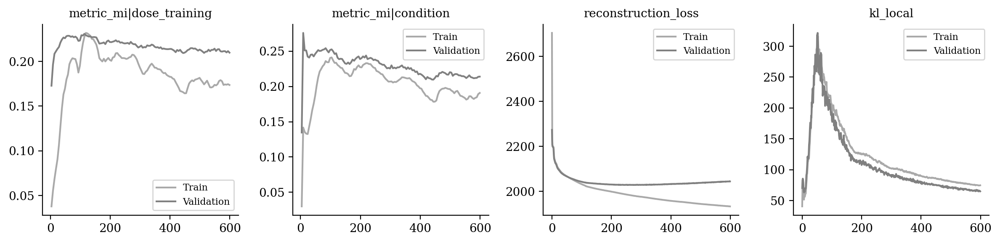

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|dose_training", "metric_mi|condition", 
                 "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

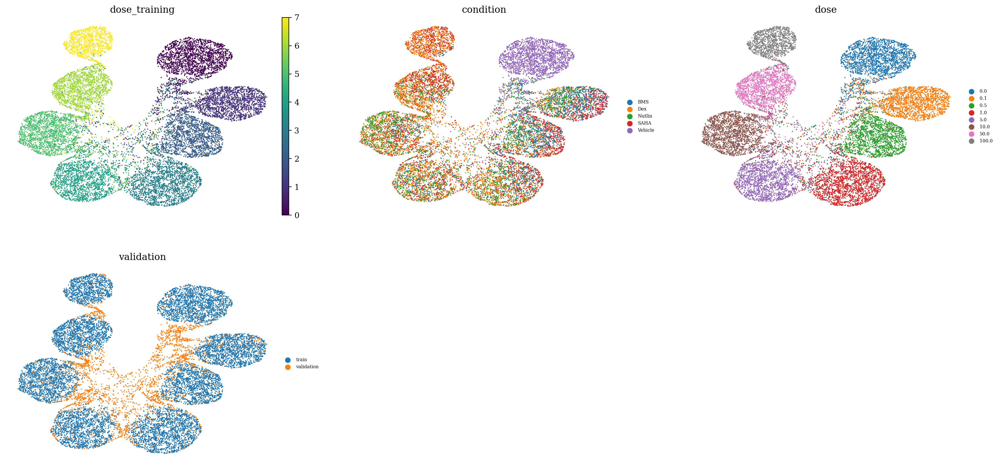

In [13]:
sublatent = DM.configurations.get_by_obs_key("dose_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

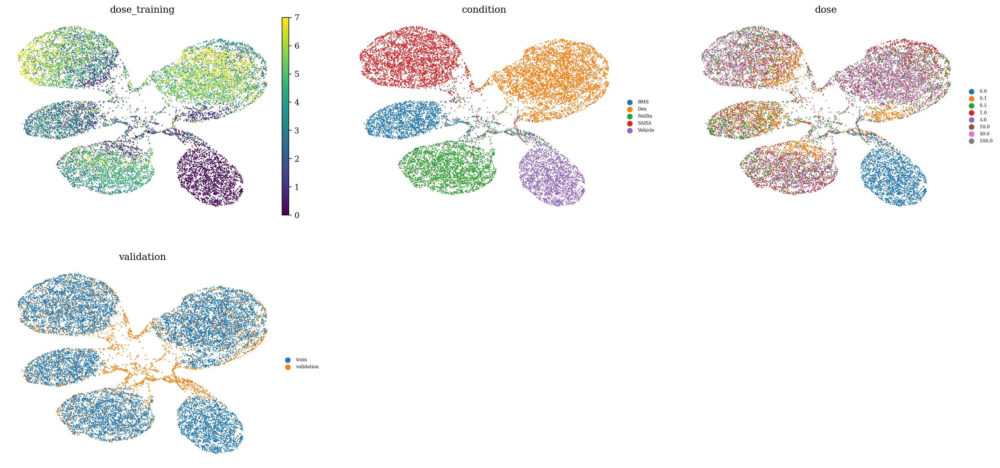

In [14]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

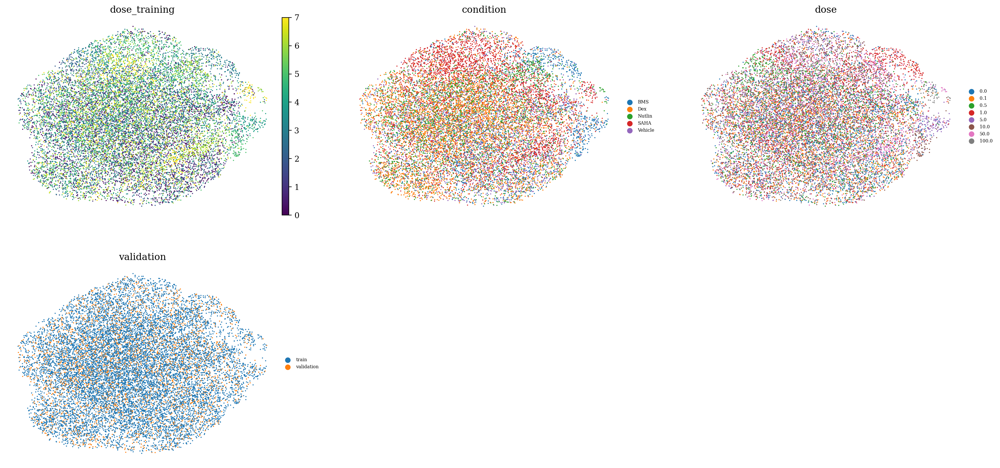

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

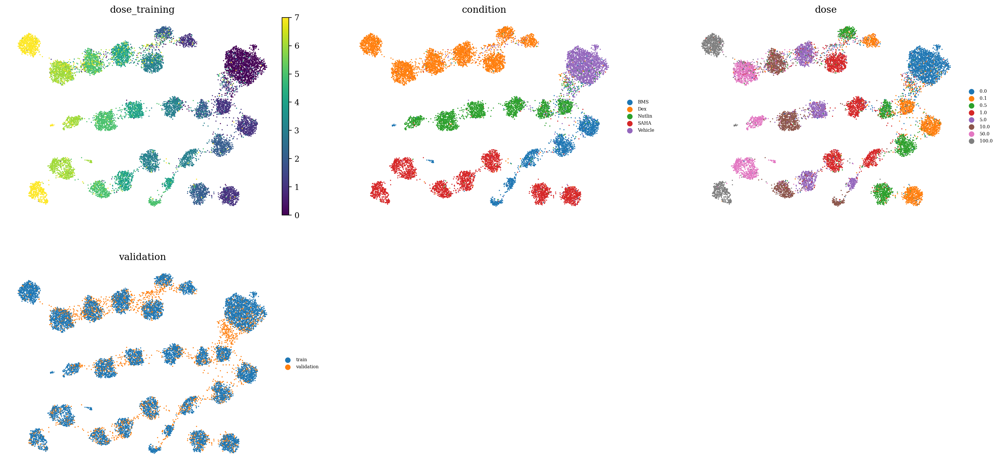

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['dose_training', 'condition', 'dose', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [17]:
1

1